In [1]:
import torch
import os
import sys
sys.path.append('/mnt/data/th')
from models.resnet import resnet8
from models.alexnet import alexnet
from FedML.fedml_api.data_preprocessing.cifar10.data_loader import (
            get_client_dataloader, get_client_idxes_dict)

In [2]:
import autograd_hacks

In [11]:
print(os.listdir('/mnt/data/th/FedTH/data/dataset'))

['cininc.tar.gz', 'cinic10_tar', 'emnist', 'cinic10', 'covid_tar', 'femnist', 'cifar100', 'imagenet', 'covtype', 'covid', 'covid.tar.gz', 'mnist', 'celeba', 'cifar10', 'svhn', 'covid19-radiography-database.zip']


In [2]:
dict_client_idexes, class_num, client_infos = get_client_idxes_dict('/mnt/data/th/FedTH/data/dataset/cifar10', "hetero", 0.3, 10)
print(client_infos)

INFO:root:*********partition data***************
INFO:root:N = 50000
INFO:root:traindata_cls_counts = {0: {2: 73, 3: 110, 5: 1, 6: 80, 7: 451, 8: 30, 9: 681}, 1: {0: 321, 1: 419, 2: 212, 3: 23, 4: 25, 5: 548, 6: 458, 7: 1730, 8: 1548}, 2: {0: 2934, 1: 1, 2: 64, 3: 1616, 4: 26, 5: 2, 6: 1170}, 3: {0: 147, 1: 28, 2: 52, 3: 1159, 4: 307, 6: 1525, 7: 31, 8: 71, 9: 4088}, 4: {0: 35, 1: 322, 2: 515, 3: 447, 4: 460, 6: 347, 7: 85, 8: 2, 9: 126}, 5: {0: 471, 1: 3, 3: 189, 4: 1932, 5: 16, 6: 480, 7: 778, 8: 17, 9: 1}, 6: {0: 63, 1: 736, 4: 242, 6: 511, 7: 298, 8: 3268}, 7: {0: 363, 1: 231, 2: 2331, 3: 1199, 5: 38, 6: 19, 7: 1626}, 8: {0: 33, 1: 3255, 2: 724, 3: 59, 5: 70, 6: 409, 7: 1, 8: 63, 9: 103}, 9: {0: 633, 1: 5, 2: 1029, 3: 198, 4: 2008, 5: 4325, 6: 1, 8: 1, 9: 1}}
INFO:root:total data num = 50000


{0: {2: 73, 3: 110, 5: 1, 6: 80, 7: 451, 8: 30, 9: 681}, 1: {0: 321, 1: 419, 2: 212, 3: 23, 4: 25, 5: 548, 6: 458, 7: 1730, 8: 1548}, 2: {0: 2934, 1: 1, 2: 64, 3: 1616, 4: 26, 5: 2, 6: 1170}, 3: {0: 147, 1: 28, 2: 52, 3: 1159, 4: 307, 6: 1525, 7: 31, 8: 71, 9: 4088}, 4: {0: 35, 1: 322, 2: 515, 3: 447, 4: 460, 6: 347, 7: 85, 8: 2, 9: 126}, 5: {0: 471, 1: 3, 3: 189, 4: 1932, 5: 16, 6: 480, 7: 778, 8: 17, 9: 1}, 6: {0: 63, 1: 736, 4: 242, 6: 511, 7: 298, 8: 3268}, 7: {0: 363, 1: 231, 2: 2331, 3: 1199, 5: 38, 6: 19, 7: 1626}, 8: {0: 33, 1: 3255, 2: 724, 3: 59, 5: 70, 6: 409, 7: 1, 8: 63, 9: 103}, 9: {0: 633, 1: 5, 2: 1029, 3: 198, 4: 2008, 5: 4325, 6: 1, 8: 1, 9: 1}}


In [3]:
train_dataloader, test_dataloader = get_client_dataloader(
                '/mnt/data/th/FedTH/data/dataset/cifar10', 64, dict_client_idexes, client_idx=0, train=True)

INFO:root:train batch: 22,val batch: 156


In [4]:
device = torch.device("cuda")

### FedAvg

In [21]:
model = resnet8(class_num).to(device)
optimizer = torch.optim.SGD(model.parameters(
        ), lr=0.01, momentum=0.9)
criterion = torch.nn.CrossEntropyLoss().to(device)
model.train()
# autograd_hacks.add_hooks(model)
epoch_loss = []
g_all_epochs = {}
for epoch in range(20):
    g_per_epochs = {k:[] for k in range(class_num)}
    batch_loss = []
    for batch_idx, (images, labels) in enumerate(train_dataloader):
        # logging.info(images.shape)
        
        optimizer.zero_grad()
        images, labels = images.to(device), labels.to(device)
        # for x,y in zip(images,labels):
        #     temp_grad = 0
        #     x = torch.unsqueeze(x,0)
        #     y = torch.unsqueeze(y,0)
        #     # y = 
        #     x, y = x.to(device), y.to(device)
        
        log_probs = model(images)
        probs = torch.softmax(log_probs,-1)
        probs_per = probs.gather(-1, labels.view(-1, 1)).reshape(-1)
        g_norm = torch.abs(1-probs_per)
        for label,g in zip(labels.tolist(),g_norm.tolist()):
            g_per_epochs[label].append(g)
        loss = criterion(log_probs, labels)
        loss.backward()
        #     for name,p in model.named_parameters():
        #         if 'fc' in name:
        #             per_sample_grad = p.grad.detach().clone()
        #             temp_grad += (per_sample_grad**2).sum().item()
        # # autograd_hacks.compute_grad1(model)
        # # autograd_hacks.disable_hooks()
        # # for na,layer in model.named_modules():
        # #     if na != "fc":
        # #         continue
        # #     if not autograd_hacks.is_supported(layer):
        # #         continue
        # #     for index,label in enumerate(labels.tolist()):
        # #         temp = 0
        # #         for name,param in layer.named_parameters():
        # #             assert torch.allclose(param.grad, param.grad1.mean(dim=0))
        # #             temp += (param.grad1[index]**2).sum().item()
        # #             # print(na,name,(param.grad1[0]**2).sum())
        #     g_per_epochs[y.item()].append(temp_grad)
                
                    
        optimizer.step()
        batch_loss.append(loss.item())
    g_all_epochs.update({epoch:g_per_epochs})


In [21]:
from torch import nn


class resnet_fedbalance_experimental(nn.Module):
    def __init__(self, model_local,model_global,KD = False) -> None:
        super(resnet_fedbalance_experimental, self).__init__()

        self.model_global = model_global
        self.model_local = model_local
        self.KD = KD

    def forward(self, x,distance):

        h_local = self.model_local(x)

        h_new = self.model_global(x)
 
        h_combine = distance*h_local + h_new

        if self.KD:
            return h_local,h_new,h_combine

        return h_combine

In [7]:

import numpy as np


def get_cdist_inner(idx):
    client_cnts = {}
    for client, info in client_infos.items():
        cnts = []
        for c in range(10):
            if c in info.keys():
                num = info[c]
            else:
                num = 0
            cnts.append(num)
        # cnts = torch.FloatTensor(np.array(cnts))
        client_cnts.update({client: torch.FloatTensor(np.array(cnts))})
    client_dis = client_cnts[idx]
    print(client_dis)
    dist = client_dis / client_dis.sum()  # 个数的比例
    cdist = dist#/dist.max()
    cdist = cdist.reshape((1, -1))
    # cdist = torch.log(cdist)
    return cdist.to(device)

In [48]:
model_global = resnet8(class_num).to(device)
model_local = alexnet(class_num).to(device)
model_ensemble = resnet_fedbalance_experimental(model_local,model_global).to(device)
# autograd_hacks.add_hooks(model_global)
cdist = get_cdist_inner(0)
optimizer = torch.optim.SGD(model_ensemble.parameters(
        ), lr=0.01, momentum=0.9)
criterion = torch.nn.CrossEntropyLoss().to(device)
model_ensemble.train()
epoch_loss = []
g_all_epochs_global = {}
g_all_epochs_ensemble = {}
for epoch in range(20):
    g_per_epochs_ensemble = {k:[] for k in range(class_num)}
    g_per_epochs_global = {k:[] for k in range(class_num)}
    # batch_loss = []
    for batch_idx, (images, labels) in enumerate(train_dataloader):
        # logging.info(images.shape)
        # images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()

        for x,y in zip(images,labels):
            temp_grad = 0
            x = torch.unsqueeze(x,0)
            y = torch.unsqueeze(y,0)
            x, y = x.to(device), y.to(device)
            
            log_probs_global = model_ensemble.model_global(x)
            log_probs_local = model_ensemble.model_local(x)
            log_probs_ensemble = log_probs_local*cdist+log_probs_global
            loss = criterion(log_probs_ensemble, y)
            loss.backward()
            for name,p in model_ensemble.model_global.named_parameters():
                if 'fc' in name:
                    per_sample_grad = p.grad.detach().clone()
                    temp_grad += (per_sample_grad**2).sum().item()
            g_per_epochs_global[y.item()].append(temp_grad)

        optimizer.step()
        # batch_loss.append(loss.item())
    # g_all_epochs_ensemble.update({epoch:g_per_epochs_ensemble})
    g_all_epochs_global.update({epoch:g_per_epochs_global})



tensor([   0.,  446.,    6.,   15.,   39.,  812., 1535., 1537.,   43.,   72.])


### FedIct

In [32]:
model_inner = resnet8(class_num).to(device)
cdist = torch.log(get_cdist_inner(0))
optimizer = torch.optim.SGD(model_inner.parameters(
        ), lr=0.01, momentum=0.9)
criterion = torch.nn.CrossEntropyLoss().to(device)
model_inner.train()
g_all_epochs_ict = {}
# autograd_hacks.add_hooks(model)
epoch_loss = []
# g_all_epochs = {}
for epoch in range(20):
    g_per_epochs = {k:[] for k in range(class_num)}
    batch_loss = []
    for batch_idx, (images, labels) in enumerate(train_dataloader):
        optimizer.zero_grad()
        images = images.to(device)
        labels = labels.to(device)
        log_probs = model_inner(images)
        with torch.no_grad():
            log_probs_local = model(images)
        probs_l = torch.sigmoid(log_probs_local).max()
        h_combine =torch.exp(1-probs_l)*cdist+log_probs #
        
        probs = torch.softmax(h_combine,-1)
        probs_per = probs.gather(-1, labels.view(-1, 1)).reshape(-1)
        g_norm = torch.abs(1-probs_per)
        for label,g in zip(labels.tolist(),g_norm.tolist()):
            g_per_epochs[label].append(g)
        loss = criterion(h_combine, labels)
        loss.backward()                   
        optimizer.step()
        batch_loss.append(loss.item())
    g_all_epochs_ict.update({epoch:g_per_epochs})


tensor([  0.,   0.,  73., 110.,   0.,   1.,  80., 451.,  30., 681.])


In [9]:
# print(g_all_epochs)
def get_df(g_all_epochs):
    import numpy
    import pandas
    res = []

    for epoch,g_per_epochs in g_all_epochs.items():
        for cls,samples in g_per_epochs.items():
            for sample in samples:
                res.append([epoch,cls,round(sample, 2)])

    res_df = pandas.DataFrame(res)
    return res_df


In [23]:
res_df_fedavg = get_df(g_all_epochs)

In [24]:
res_df_fedavg

,0,1,2
0,0,2,0.87
1,0,2,0.86
2,0,2,0.87
3,0,2,0.88
4,0,2,0.83
...,...,...,...
28155,19,9,0.04
28156,19,9,0.02
28157,19,9,0.06
28158,19,9,0.01


In [25]:
res_df_global = get_df(g_all_epochs_global)
# res_df_ensemble = get_df(g_all_epochs_ensemble)

NameError: name 'g_all_epochs_global' is not defined

In [33]:
res_df_ict = get_df(g_all_epochs_ict)

In [27]:
res_df_ict

,0,1,2
0,0,2,0.88
1,0,2,0.90
2,0,2,0.89
3,0,2,0.91
4,0,2,0.90
...,...,...,...
28155,19,9,0.67
28156,19,9,0.58
28157,19,9,0.77
28158,19,9,0.59


In [34]:
res_df_fedavg.columns = ["epoch","label","g"]
res_df_ict.columns = ["epoch","label","g"]
# res_df_ensemble.columns = ["epoch","label","g"]

In [53]:
res_df_global

,epoch,label,g
0,0,1,97.36
1,0,1,248.38
2,0,1,306.14
3,0,1,1503.54
4,0,1,1859.10
...,...,...,...
89595,19,9,NaN
89596,19,9,NaN
89597,19,9,NaN
89598,19,9,NaN


In [54]:
res_df_fedavg

,epoch,label,g
0,0,1,99.66
1,0,1,1469.47
2,0,1,1501.66
3,0,1,2755.97
4,0,1,8103.01
...,...,...,...
89595,19,9,8.22
89596,19,9,79.79
89597,19,9,25.95
89598,19,9,29.13


In [68]:
print(res_df_fedavg["epoch"].unique())

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]


### FedAvg

In [64]:
import numpy
df_epoch = res_df_fedavg[res_df_fedavg["epoch"]==0]
res = {i:0 for i in range(10)}
for i in range(10):
    res[i] = round(df_epoch[df_epoch["label"]==i]["g"].sum(),0)
print(res)
temp =numpy.array(list(res.values()))
print(temp/temp.sum())
print(client_infos[0])
# df_epoch["g"].value_counts(

{0: 0.0, 1: 106102.0, 2: 4360.0, 3: 775.0, 4: 7071.0, 5: 214750.0, 6: 423012.0, 7: 374701.0, 8: 9554.0, 9: 6156.0}
[0.         0.0925458  0.00380294 0.00067598 0.00616757 0.18731231
 0.36896556 0.32682705 0.00833333 0.00536947]
{1: 446, 2: 6, 3: 15, 4: 39, 5: 812, 6: 1535, 7: 1537, 8: 43, 9: 72}


In [68]:
df_epoch = res_df_fedavg[res_df_fedavg["epoch"]==5]
res = {i:0 for i in range(i)}
for i in range(10):
    res[i] = round(df_epoch[df_epoch["label"]==i]["g"].sum(),0)
print(res)
temp =numpy.array(list(res.values()))
print(temp/temp.sum())
print(client_infos[0])

{0: 0.0, 1: 33041.0, 2: 414.0, 3: 1363.0, 4: 3501.0, 5: 61084.0, 6: 116440.0, 7: 117273.0, 8: 2510.0, 9: 5532.0}
[0.         0.09684955 0.00121351 0.00399522 0.01026211 0.179049
 0.34130813 0.34374982 0.00735729 0.01621536]
{1: 446, 2: 6, 3: 15, 4: 39, 5: 812, 6: 1535, 7: 1537, 8: 43, 9: 72}


In [32]:
res_temp = []
for e in range(20):
    res_temp.append(round(res_df_fedavg[(res_df_fedavg["label"]==7)&(res_df_fedavg["epoch"]==e)]["g"].sum(),0))
print(res_temp)


[32134.0, 31935.0, 32280.0, 31765.0, 32480.0, 32164.0, 31733.0, 32288.0, 31685.0, 32210.0, 31831.0, 32065.0, 32300.0, 32533.0, 31707.0, 31989.0, 31931.0, 31351.0, 32217.0, 32247.0]


### Ensemble

In [17]:
df_epoch = res_df_ensemble[res_df_ensemble["epoch"]==0]
res = {i:0 for i in range(10)}
for i in range(10):
    res[i] = round(df_epoch[df_epoch["label"]==i]["g"].sum(),0)
print(res)
print(client_infos[0])

{0: 368.0, 1: 18.0, 2: 223.0, 3: 213.0, 4: 6.0, 5: 711.0, 6: 24.0, 7: 1079.0, 8: 7.0, 9: 951.0}
{0: 433, 1: 18, 2: 235, 3: 227, 4: 6, 5: 883, 6: 25, 7: 1750, 8: 7, 9: 1529}


In [18]:
df_epoch = res_df_ensemble[res_df_ensemble["epoch"]==10]
res = {i:0 for i in range(10)}
for i in range(10):
    res[i] = round(df_epoch[df_epoch["label"]==i]["g"].sum(),0)
print(res)
print(client_infos[0])

{0: 249.0, 1: 18.0, 2: 200.0, 3: 205.0, 4: 6.0, 5: 488.0, 6: 24.0, 7: 651.0, 8: 7.0, 9: 448.0}
{0: 433, 1: 18, 2: 235, 3: 227, 4: 6, 5: 883, 6: 25, 7: 1750, 8: 7, 9: 1529}


In [19]:
res_temp = []
for e in range(20):
    res_temp.append(round(res_df_ensemble[(res_df_ensemble["label"]==7)&(res_df_ensemble["epoch"]==e)]["g"].sum(),0))
print(res_temp)

[1079.0, 944.0, 915.0, 852.0, 823.0, 801.0, 746.0, 717.0, 686.0, 669.0, 651.0, 629.0, 617.0, 583.0, 588.0, 574.0, 555.0, 551.0, 528.0, 539.0]


### Global

In [69]:
df_epoch = res_df_global[res_df_global["epoch"]==0]
res = {i:0 for i in range(10)}
for i in range(10):
    res[i] = round(df_epoch[df_epoch["label"]==i]["g"].sum(),0)
print(res)
temp =numpy.array(list(res.values()))
print(temp/temp.sum())
print(client_infos[0])

{0: 0.0, 1: 181198.0, 2: 538.0, 3: 880.0, 4: 3603.0, 5: 366974.0, 6: 522579.0, 7: 740346.0, 8: 10135.0, 9: 16039.0}
[0.00000000e+00 9.83546582e-02 2.92027540e-04 4.77665864e-04
 1.95571603e-03 1.99194265e-01 2.83656988e-01 4.01861377e-01
 5.50129947e-03 8.70600317e-03]
{1: 446, 2: 6, 3: 15, 4: 39, 5: 812, 6: 1535, 7: 1537, 8: 43, 9: 72}


In [67]:
df_epoch = res_df_global[res_df_global["epoch"]==5]
res = {i:0 for i in range(10)}
for i in range(10):
    res[i] = round(df_epoch[df_epoch["label"]==i]["g"].sum(),0)
print(res)
temp =numpy.array(list(res.values()))
print(temp/temp.sum())
print(client_infos[0])

{0: 0.0, 1: 53933.0, 2: 306.0, 3: 593.0, 4: 3640.0, 5: 105223.0, 6: 199765.0, 7: 177801.0, 8: 8048.0, 9: 7818.0}
[0.         0.09680558 0.00054925 0.00106439 0.00653352 0.18886717
 0.35856277 0.31913908 0.01444554 0.01403271]
{1: 446, 2: 6, 3: 15, 4: 39, 5: 812, 6: 1535, 7: 1537, 8: 43, 9: 72}


"""
[0.         0.0925458  0.00380294 0.00067598 0.00616757 0.18731231 0.36896556 0.32682705 0.00833333 0.00536947]

[0.00000000e+00 9.83546582e-02 2.92027540e-04 4.77665864e-04 1.95571603e-03 1.99194265e-01 2.83656988e-01 4.01861377e-01 5.50129947e-03 8.70600317e-03]

[0.         0.09684955 0.00121351 0.00399522 0.01026211 0.179049 0.34130813 0.34374982 0.00735729 0.01621536]

[0.         0.09680558 0.00054925 0.00106439 0.00653352 0.18886717 0.35856277 0.31913908 0.01444554 0.01403271]

{1: 446, 2: 6, 3: 15, 4: 39, 5: 812, 6: 1535, 7: 1537, 8: 43, 9: 72}

"""

In [59]:
res_temp = []
for e in range(20):
    res_temp.append(round(res_df_global[(res_df_global["label"]==7)&(res_df_global["epoch"]==e)]["g"].sum(),0))
print(res_temp)

[740346.0, 80609.0, 89901.0, 99749.0, 127364.0, 177801.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


In [70]:
res_df_fedavg

,epoch,label,g
0,0,1,99.66
1,0,1,1469.47
2,0,1,1501.66
3,0,1,2755.97
4,0,1,8103.01
...,...,...,...
89595,19,9,8.22
89596,19,9,79.79
89597,19,9,25.95
89598,19,9,29.13


In [106]:
res_df_fedavg_most_sum = res_df_fedavg.groupby(["epoch"])['g'].sum()
res_df_global_most_sum = res_df_global.groupby(["epoch"])['g'].sum()
res_df_fedavg_most_sum_df = res_df_fedavg_most_sum.to_frame()
res_df_global_most_sum_df = res_df_global_most_sum.to_frame()
res_df_fedavg_most_sum_df.reset_index(inplace=True)
res_df_global_most_sum_df.reset_index(inplace=True) 

In [99]:
res_most_part_fedavg = {}
for j in range(6):
    temp = 0
    for i in [5,6,7]:
        temp += res_df_fedavg[(res_df_fedavg["epoch"]==j)&(res_df_fedavg["label"]==i)]["g"].sum()/(res_df_fedavg_most_sum_df[res_df_fedavg_most_sum_df["epoch"]==j]["g"].values)[0]
    res_most_part_fedavg.update({j:temp})

In [100]:
res_most_part_fedavg

{0: 0.883105653030998,
 1: 0.8662570242627576,
 2: 0.87502567158748,
 3: 0.8610211019893624,
 4: 0.8563768709495743,
 5: 0.8641063372197387}

In [109]:
res_most_part_global = {}

for j in range(6):
    temp = 0
    for i in [5,6,7]:
        temp += res_df_global[(res_df_global["epoch"]==j)&(res_df_global["label"]==i)]["g"].sum()/(res_df_global_most_sum_df[res_df_global_most_sum_df["epoch"]==j]["g"].values)[0]
    res_most_part_global.update({j:temp})

In [110]:
res_most_part_global

{0: 0.8847131038591212,
 1: 0.8641618080832025,
 2: 0.8654946466331773,
 3: 0.8578139494340018,
 4: 0.8668796261555738,
 5: 0.8665692707291159}

In [ ]:
{0: 0.883105653030998, 1: 0.8662570242627576, 2: 0.87502567158748, 3: 0.8610211019893624, 4: 0.8563768709495743, 5: 0.8641063372197387}
{0: 0.8847131038591212, 1: 0.8641618080832025, 2: 0.8654946466331773, 3: 0.8578139494340018, 4: 0.8668796261555738, 5: 0.8665692707291159}

In [116]:

import pandas


res_most_part_fedavg_df = pandas.DataFrame(res_most_part_fedavg,index=range(len(res_most_part_fedavg)))
res_most_part_global_df = pandas.DateFrame(res_most_part_global,index=range(len(res_most_part_global)))

AttributeError: module 'pandas' has no attribute 'DateFrame'

In [71]:
res_df_fedavg_most = res_df_fedavg[(res_df_fedavg["label"]==5)|(res_df_fedavg["label"]==6)|(res_df_fedavg["label"]==7)]
res_df_global_most = res_df_global[(res_df_global["label"]==5)|(res_df_global["label"]==6)|(res_df_global["label"]==7)]

In [ ]:
res_df_fedavg_most_sum = res_all_most_class_list.groupby(['label',"method","epoch"])['g'].sum()

In [22]:
import pandas

res_df_fedavg["method"]="fedavg"
res_df_global["method"]="global"
res_df_ensemble["method"]="ensemble"

res_all = pandas.concat([res_df_fedavg,res_df_global,res_df_ensemble])

In [23]:
# res_all_most_class_list = []
# for i in [5,6,7]:
res_all_most_class_list = res_all[(res_all["label"]==5)|(res_all["label"]==7)|(res_all["label"]==9)]

In [24]:
res_all_most_class_df = res_all_most_class_list.groupby(['label',"method","epoch"])['g'].sum()

In [32]:
res_all_most_class_df.unstack(level='method')

method       ensemble   fedavg   global
label epoch                            
5     0        711.36   717.31   709.56
      1        646.60   652.93   643.85
      2        596.09   611.58   593.87
      3        565.11   591.33   562.98
      4        551.93   564.85   549.69
      5        544.98   547.67   542.92
      6        516.54   522.98   514.66
      7        514.40   508.18   512.60
      8        509.83   515.03   507.85
      9        485.11   492.70   483.59
      10       487.92   479.85   486.19
      11       469.05   481.88   467.78
      12       477.57   479.79   476.15
      13       471.05   476.03   469.56
      14       458.54   476.70   457.07
      15       454.35   462.24   453.12
      16       446.99   456.80   445.73
      17       455.97   451.66   454.79
      18       453.99   451.81   452.87
      19       450.67   440.35   449.51
7     0       1079.18  1083.57  1089.39
      1        944.45   966.90   956.31
      2        914.52   895.40   924.90
      3        851.74   826.86   862.15
      4        822.87   802.55   832.86
      5        800.72   758.34   809.94
      6        746.40   728.37   755.38
      7        716.98   700.00   725.62
      8        686.09   684.29   694.02
      9        668.78   648.27   676.57
      10       651.41   635.47   658.32
      11       629.40   608.00   636.37
      12       617.19   598.75   624.34
      13       583.15   569.98   589.82
      14       588.12   576.60   594.73
      15       574.38   557.94   580.31
      16       555.01   551.91   560.93
      17       550.74   534.68   556.58
      18       528.41   528.63   534.69
      19       539.32   510.34   545.28
9     0        950.57   958.35   950.37
      1        743.32   761.16   742.69
      2        651.86   680.20   650.89
      3        621.94   615.08   621.09
      4        584.58   574.60   584.07
      5        556.46   555.69   556.48
      6        525.78   533.01   525.72
      7        484.15   484.89   484.40
      8        465.70   444.20   465.60
      9        453.49   418.32   453.46
      10       447.89   403.89   448.04
      11       403.37   384.36   403.15
      12       400.13   371.64   400.24
      13       375.73   361.55   375.69
      14       369.85   353.92   370.28
      15       362.26   343.59   362.92
      16       347.38   330.76   347.70
      17       337.77   315.30   338.17
      18       333.23   322.63   333.67
      19       316.65   315.27   317.38

In [1]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas
plt.style.use(['science','ieee','retro'])
# for epoch in range(20):
res_all_most_class_df.T.plot(kind="line",stacked=False,figsize=(6,6))
plt.ylim((0, 1000))
# plt.legend(loc="upper left",ncol= 10)
plt.show()

NameError: name 'res_all_most_class_df' is not defined

In [26]:

res_temp = []
for e in range(20):
    res_temp.append(round(res_df_global[(res_df_global["label"]==7)&(res_df_global["epoch"]==e)]["g"].sum(),0))
print(res_temp)

[262.0, 251.0, 238.0, 239.0, 231.0, 234.0, 227.0, 226.0, 220.0, 213.0, 216.0, 209.0, 207.0, 188.0, 195.0, 184.0, 186.0, 176.0, 168.0, 164.0]


In [124]:
res_fedavg_per_class = {x:{y:0 for y in range(10)} for x in range(20)}

for e,v in res_fedavg_per_class.items():
    for c in v.keys():
        v[c] = round(res_df_fedavg[(res_df_fedavg["label"]==c)&(res_df_fedavg["epoch"]==e)]["g"].sum(),2)

res_fedavg_per_class_df = pandas.DataFrame(res_fedavg_per_class)
print(res_fedavg_per_class_df)



          0         1          2          3          4          5          6   \
0       0.00      0.00       0.00       0.00       0.00       0.00       0.00   
1  106102.26  26049.38   25273.27   39431.81   50985.24   33041.25   36521.26   
2    4359.75    577.87     375.86     149.65     288.84     413.89     864.04   
3     774.79    902.28    1009.06     777.62    1586.71    1363.49    1721.75   
4    7070.90   2891.11    2720.66    2863.87    3468.88    3500.55    3477.04   
5  214749.84  49470.81   53844.62   66747.12   88441.39   61084.25   64849.39   
6  423011.82  92358.64   96130.09  128844.95  164267.14  116440.33  122698.58   
7  374701.00  97649.47  104344.79  129330.74  159742.91  117272.59  124681.00   
8    9553.63   2663.82    2369.52    3067.66    5566.28    2510.14    3840.19   
9    6155.66   3889.12    4574.46    6155.74    7276.36    5531.95    6043.01   

          7          8          9          10         11        12         13  \
0       0.00       0.00    

In [133]:
# print(res_fedavg_per_class_df.groupby(["epoch"]))

KeyError: 'epoch'

In [127]:
res_ict_per_class = {x:{y:0 for y in range(10)} for x in range(20)}

for e,v in res_ict_per_class.items():
    for c in v.keys():
        v[c] = round(res_df_ict[(res_df_ict["label"]==c)&(res_df_ict["epoch"]==e)]["g"].sum(),2)

res_ict_per_class_df = pandas.DataFrame(res_ict_per_class)

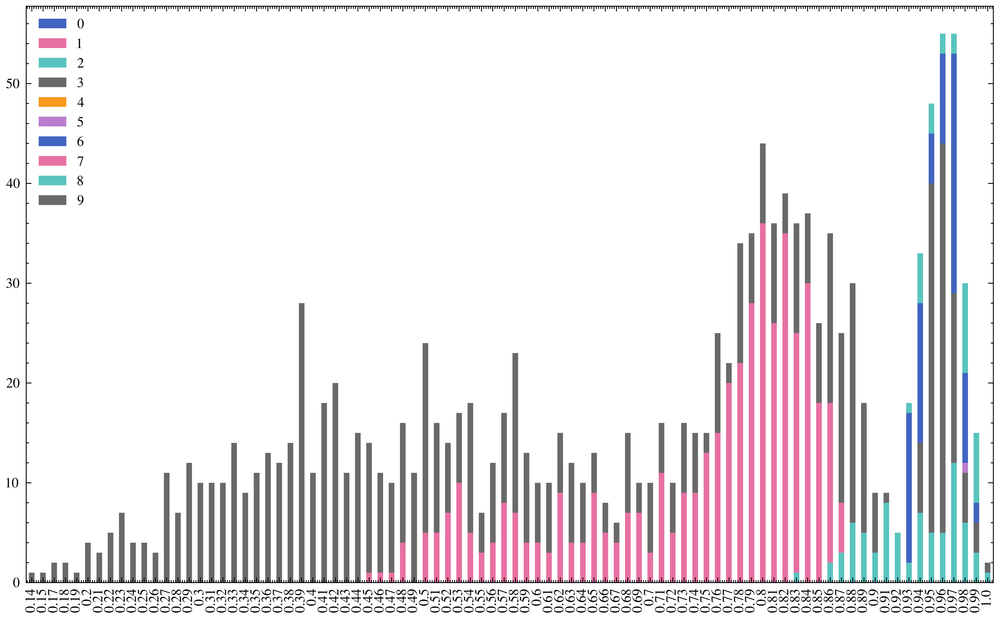

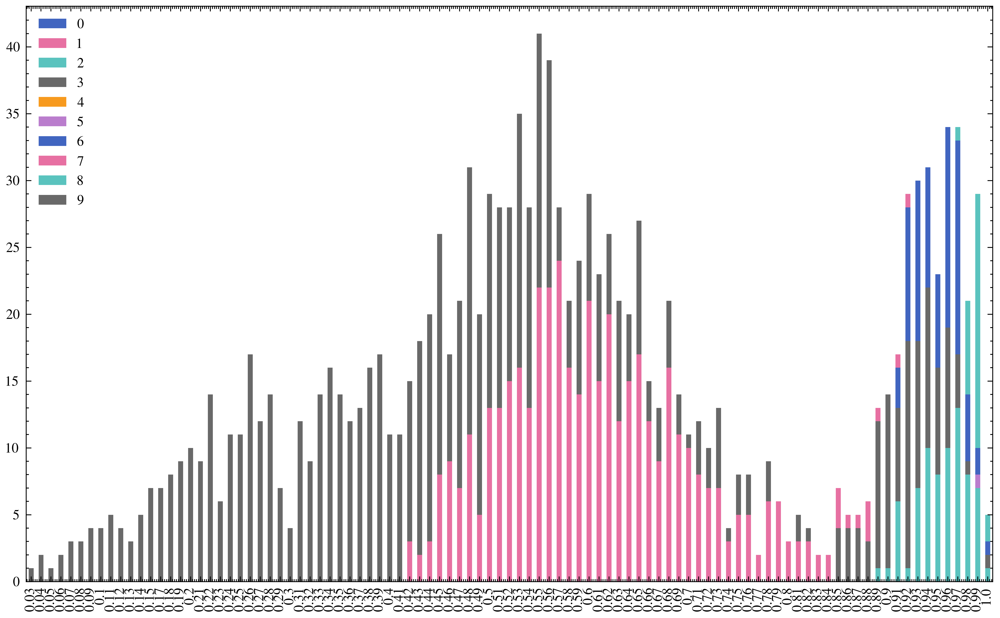

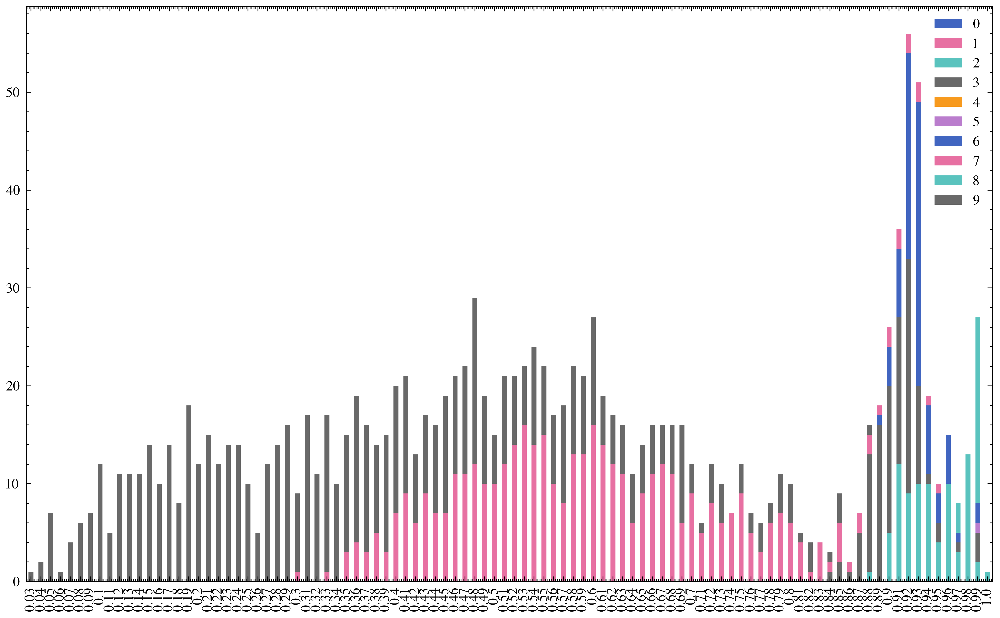

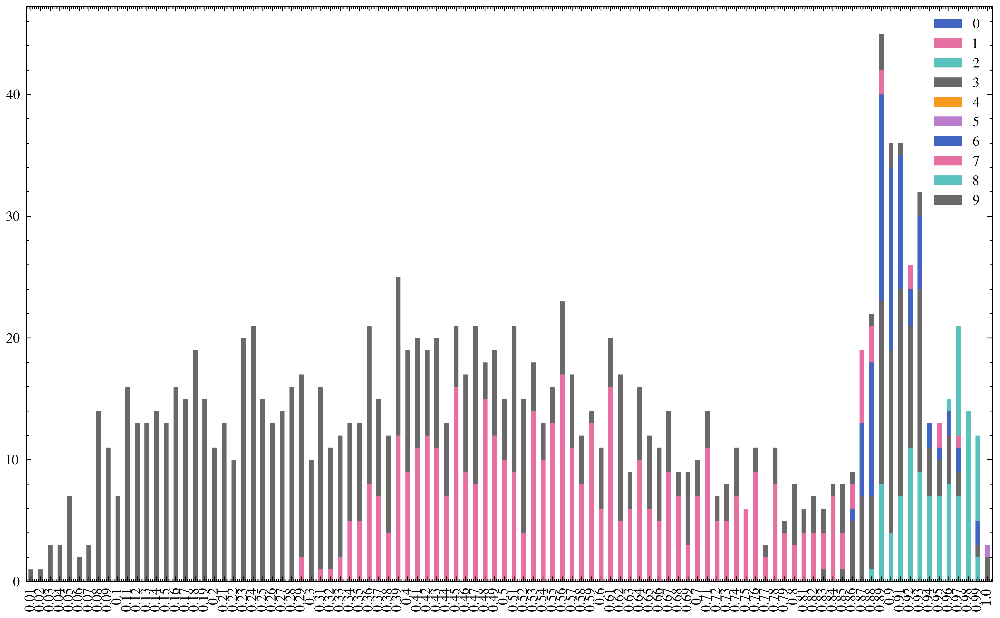

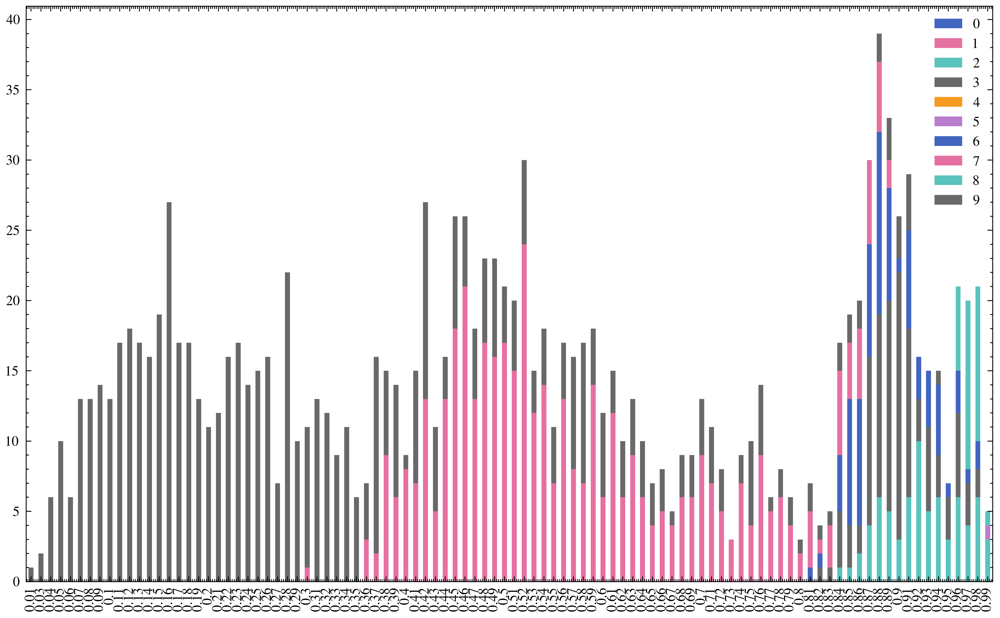

...

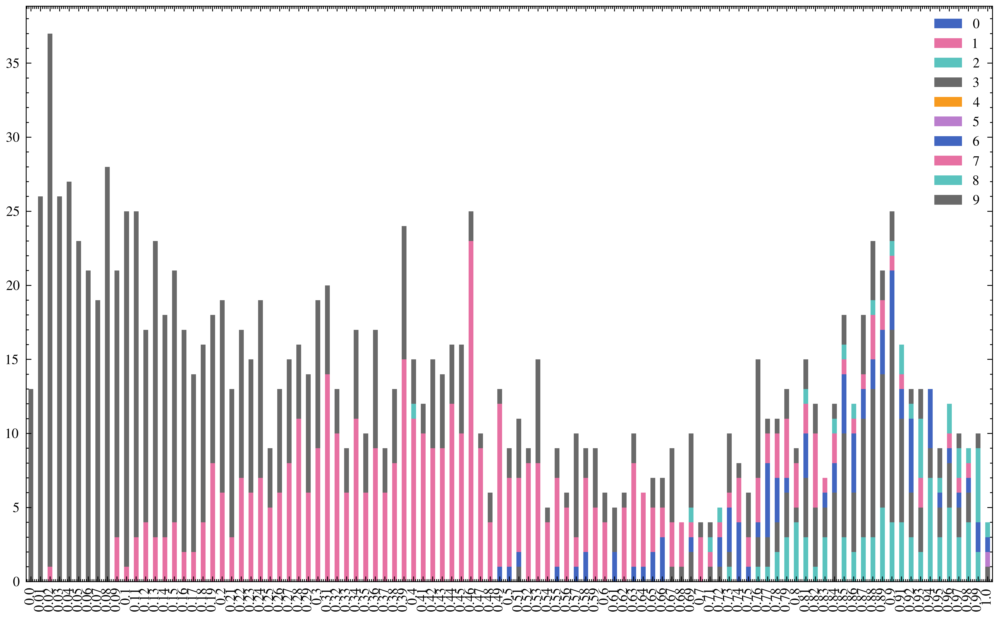

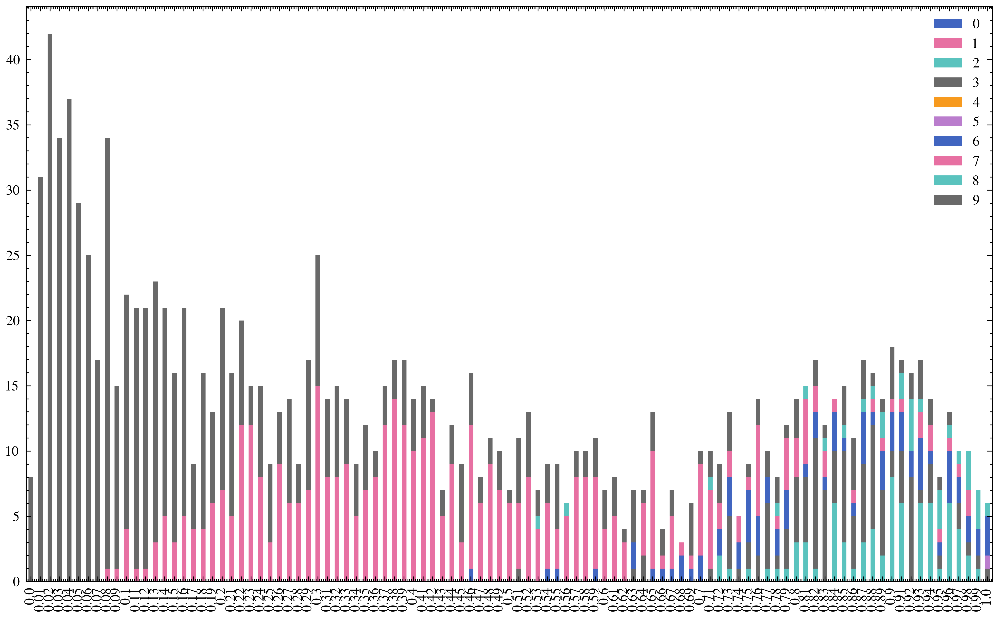

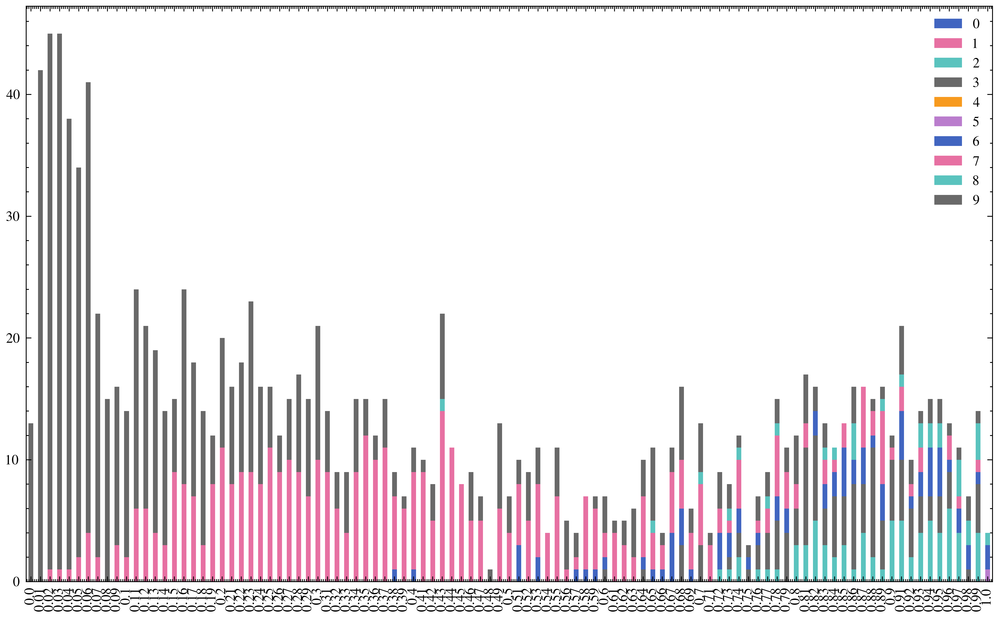

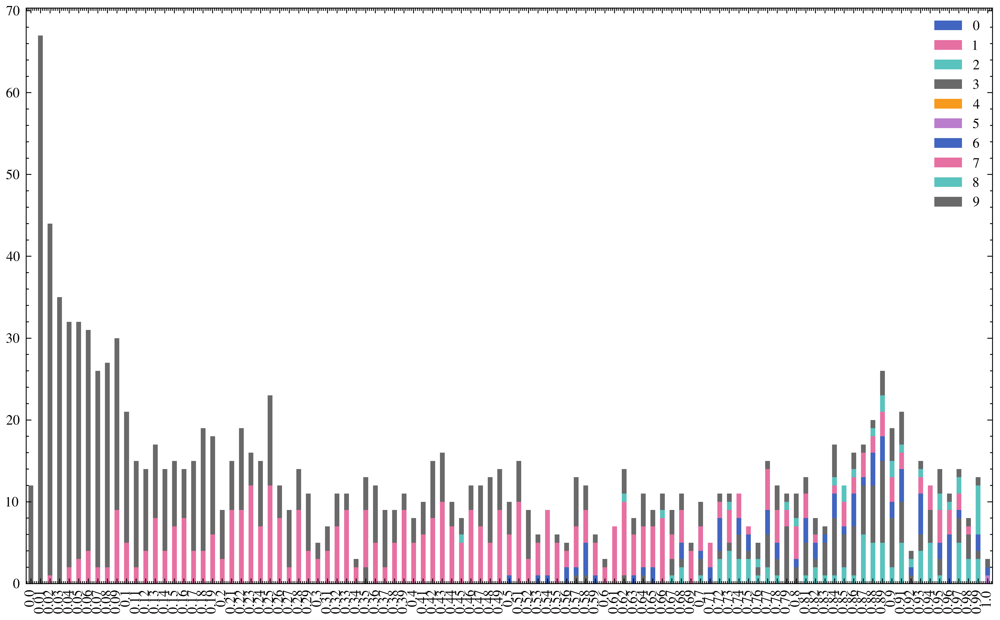

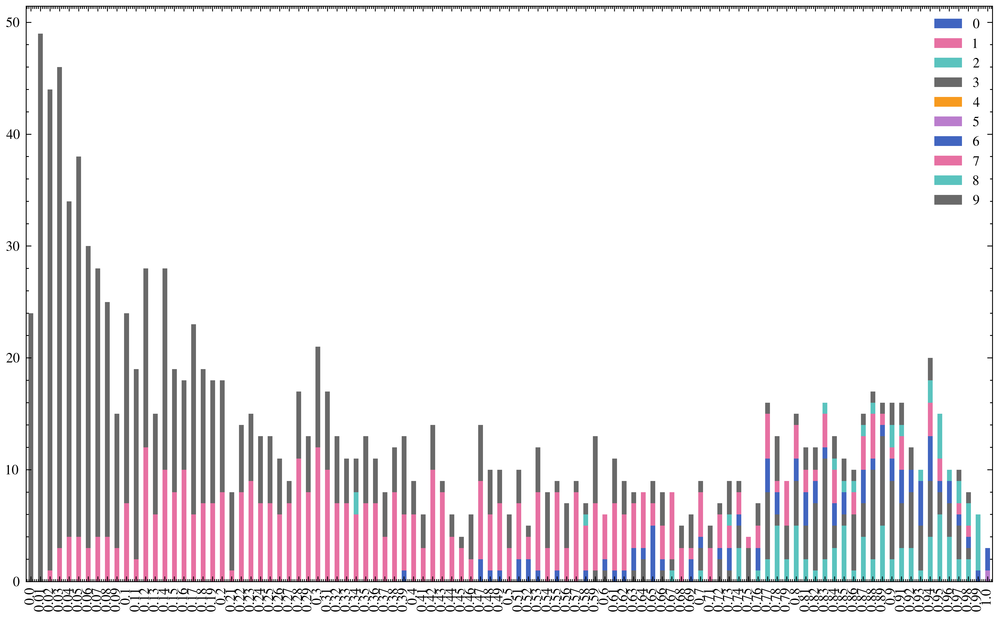

In [38]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas
plt.style.use(['science','ieee','retro'])
for epoch in range(20): 
    fig=plt.figure()
    ax=fig.add_subplot(111)

    df_epoch = res_df_fedavg[res_df_fedavg["epoch"]==epoch]
    res_temp = {x:{j:0 for j in range(10)} for x in df_epoch["g"].unique()}
    for g_target in res_temp.keys():
        for i in range(10):
            res_temp[g_target][i]=((df_epoch["label"]==i)&(df_epoch["g"]==g_target)).sum()
    # df_temp.index = res_df_fedavg["g"].unique()
    res_temp_df = pandas.DataFrame(res_temp)
    res_temp_df = res_temp_df.T.sort_index(ascending=True)
    res_temp_df.plot(kind="bar",stacked=True,figsize=(10,6),ax=ax)
    # ax.set_xlim(0,1)
    # ax.set_ylim(0,600)
    # plt.xlim((0,1))
    # plt.legend(loc="upper left",ncol= 10)
    plt.show()


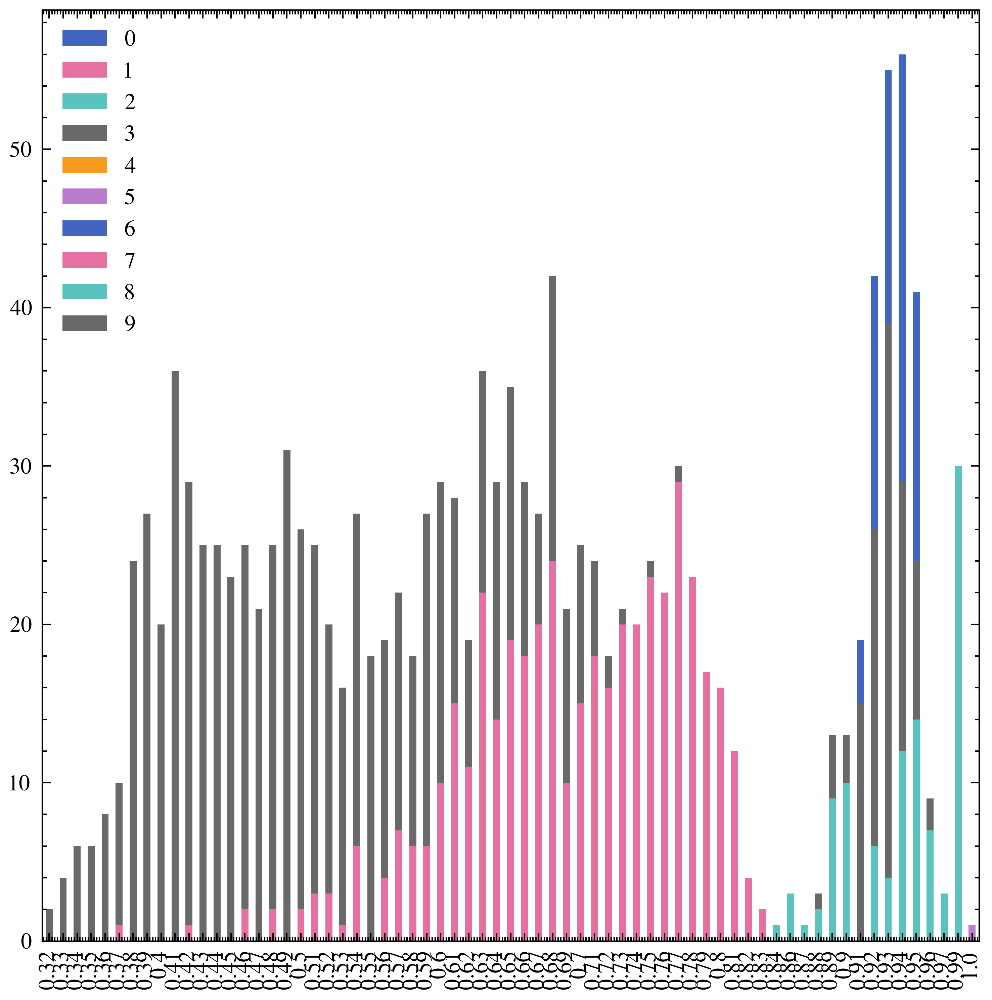

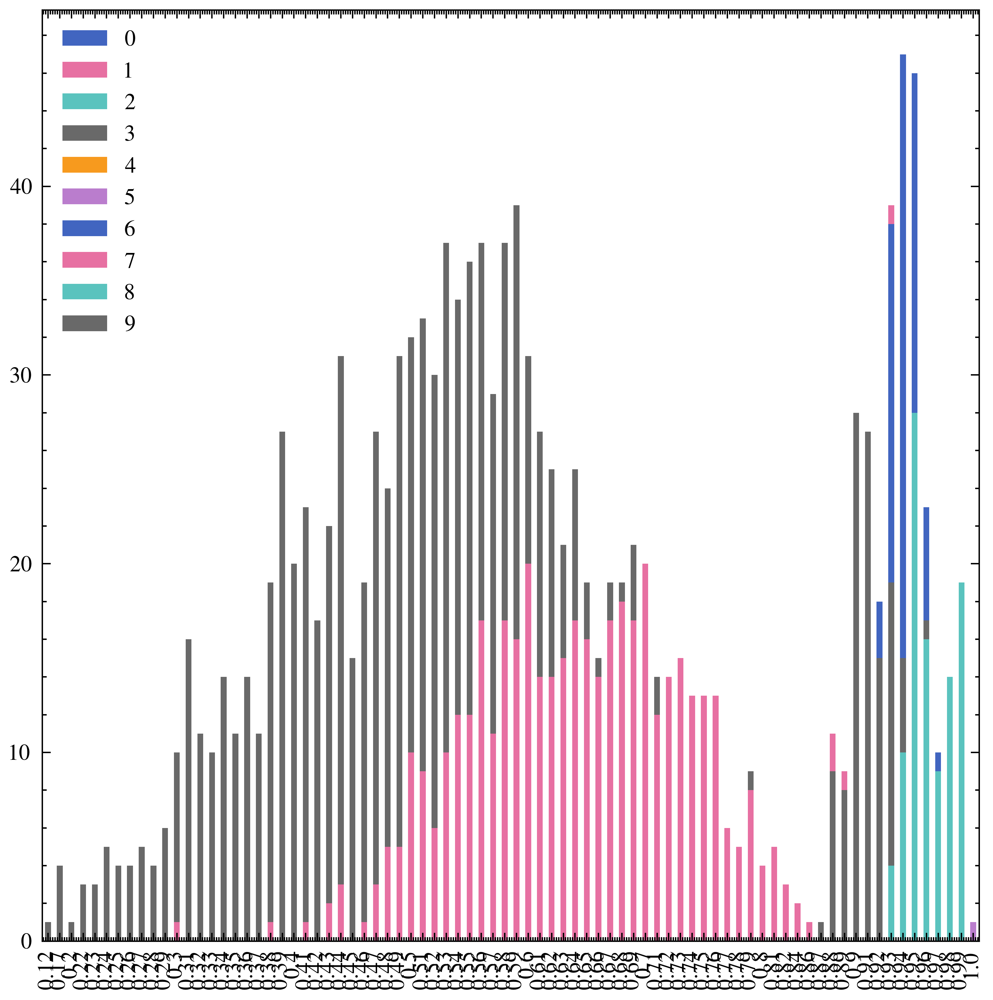

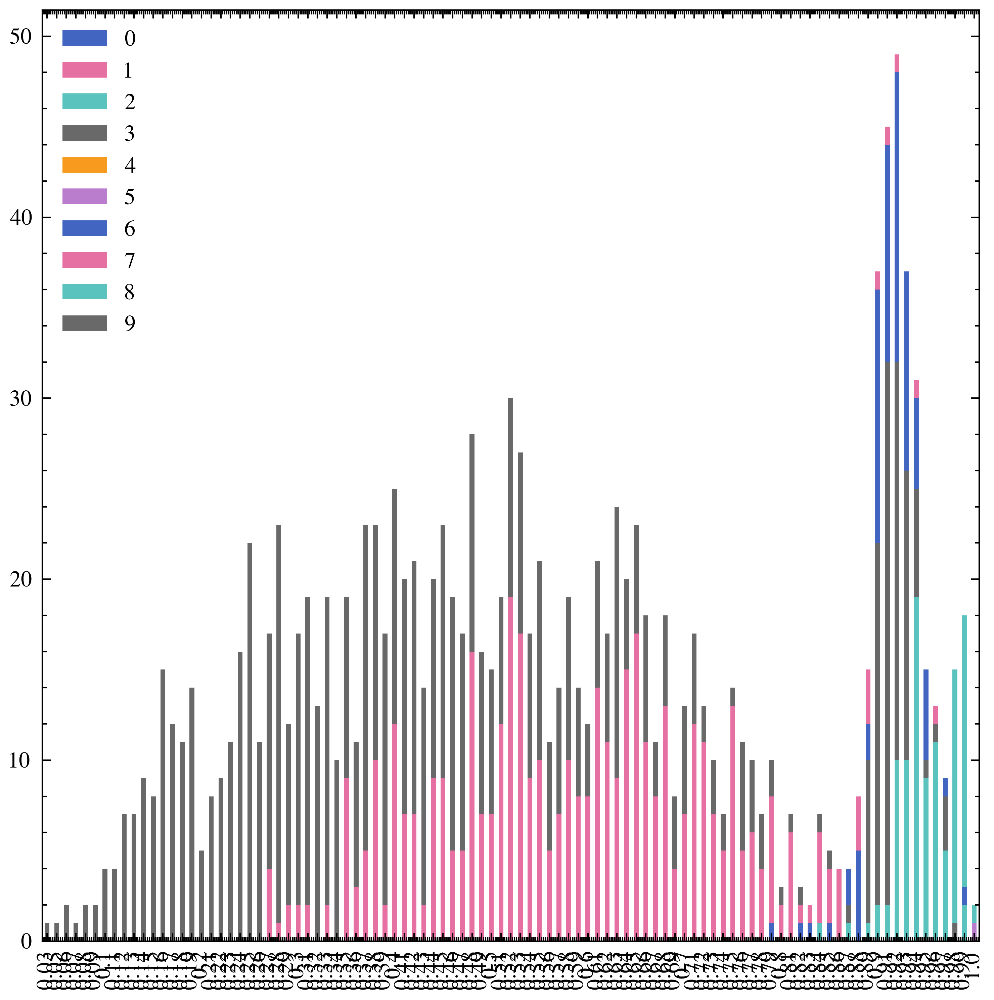

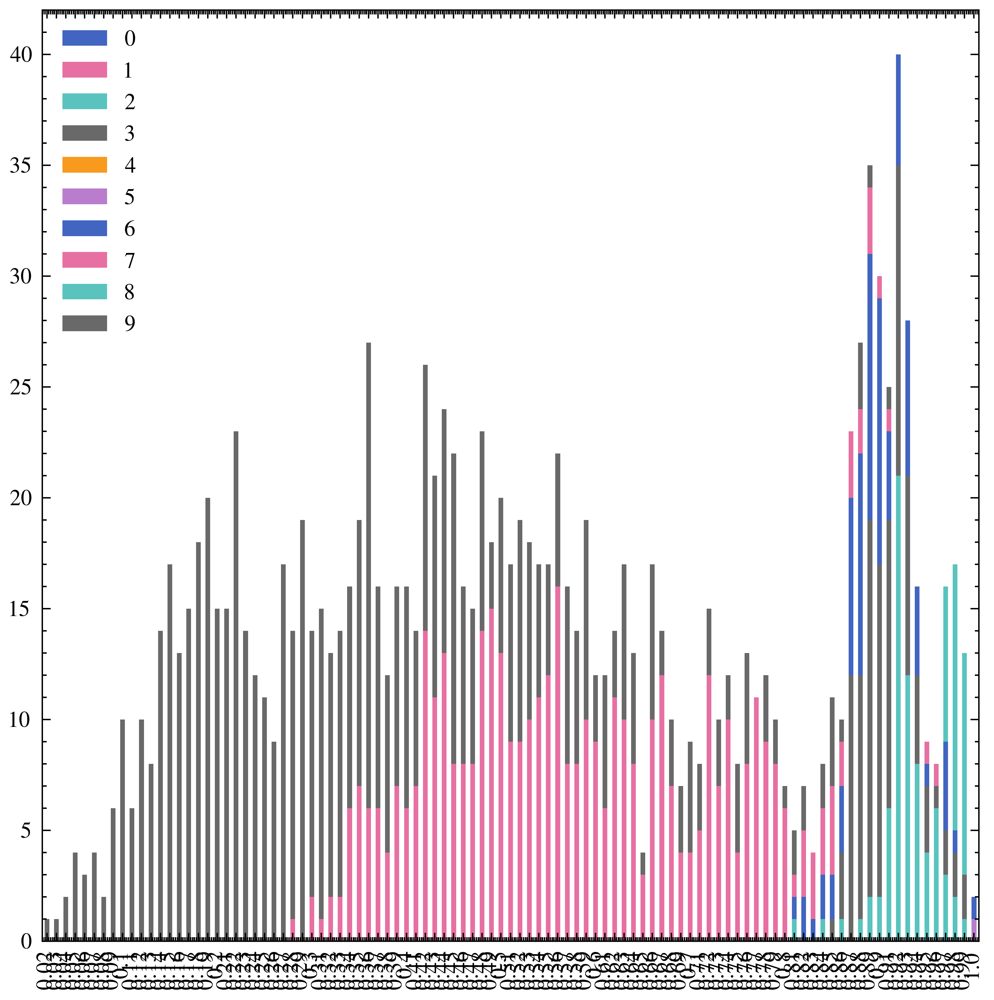

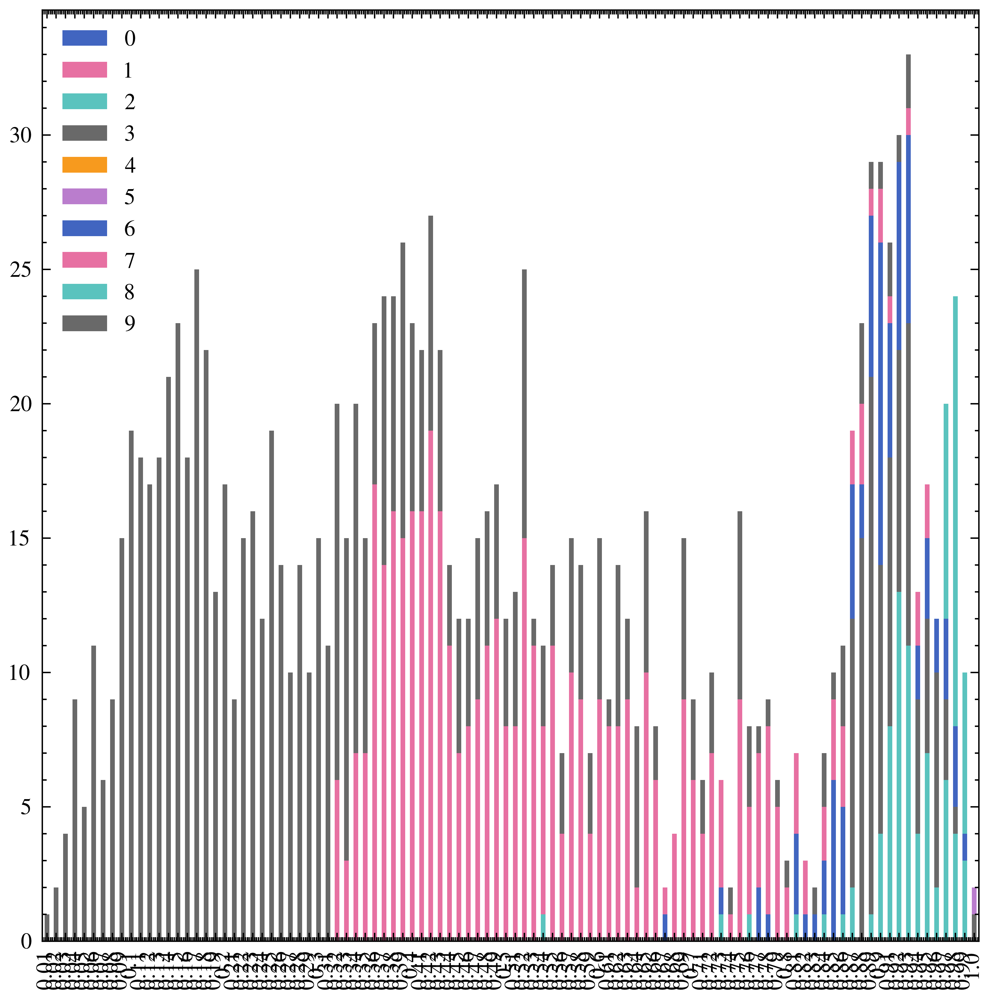

...

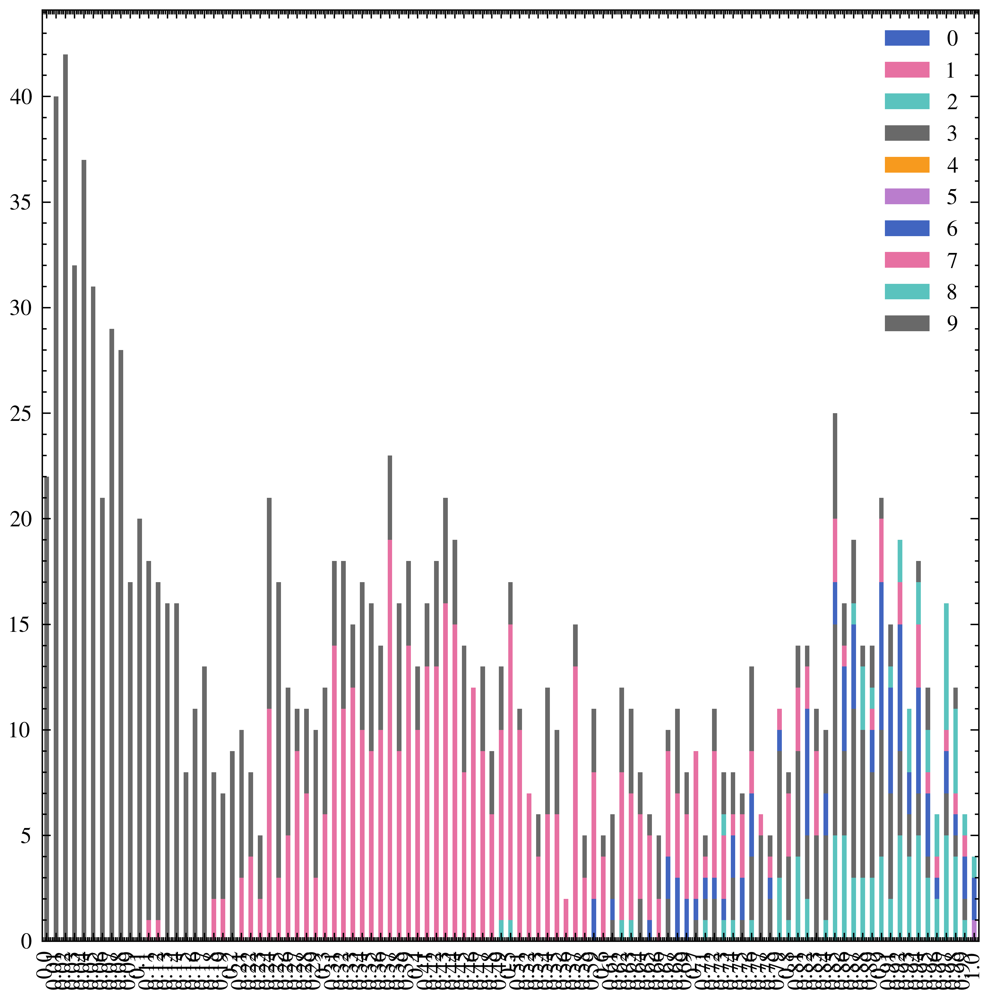

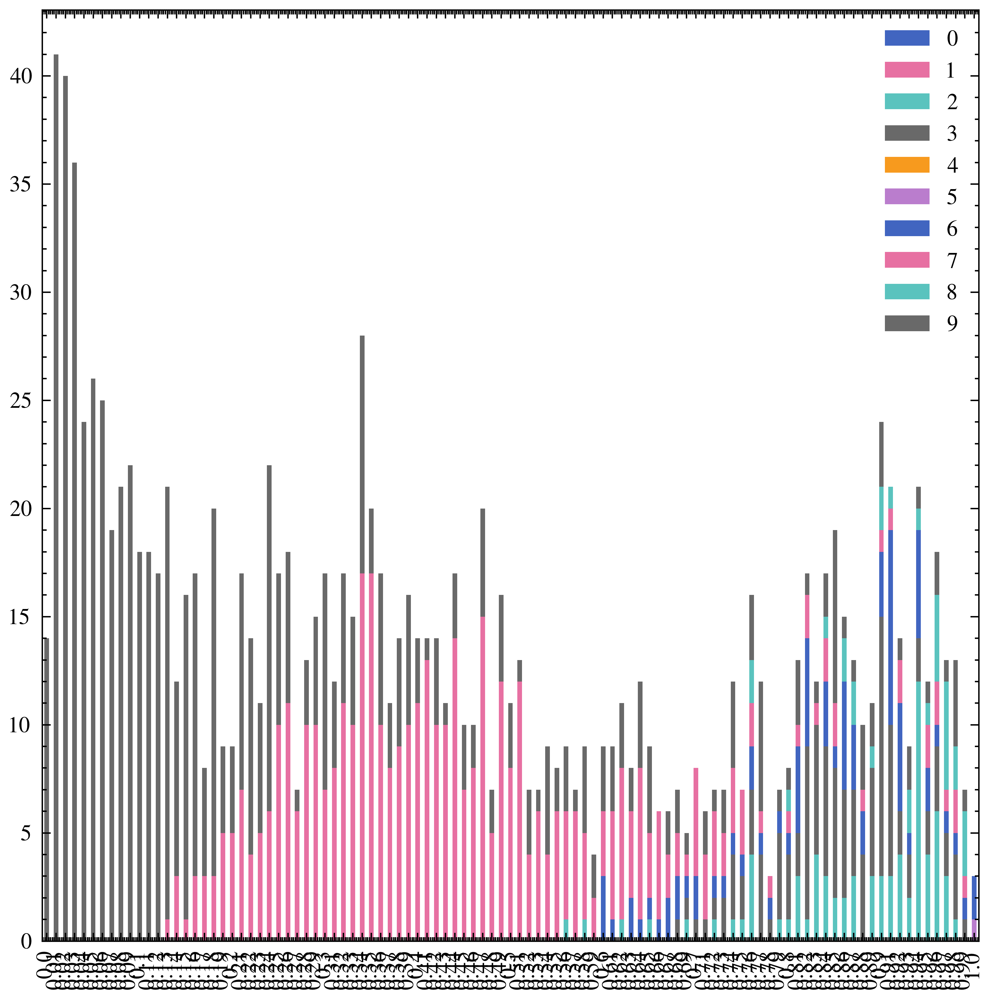

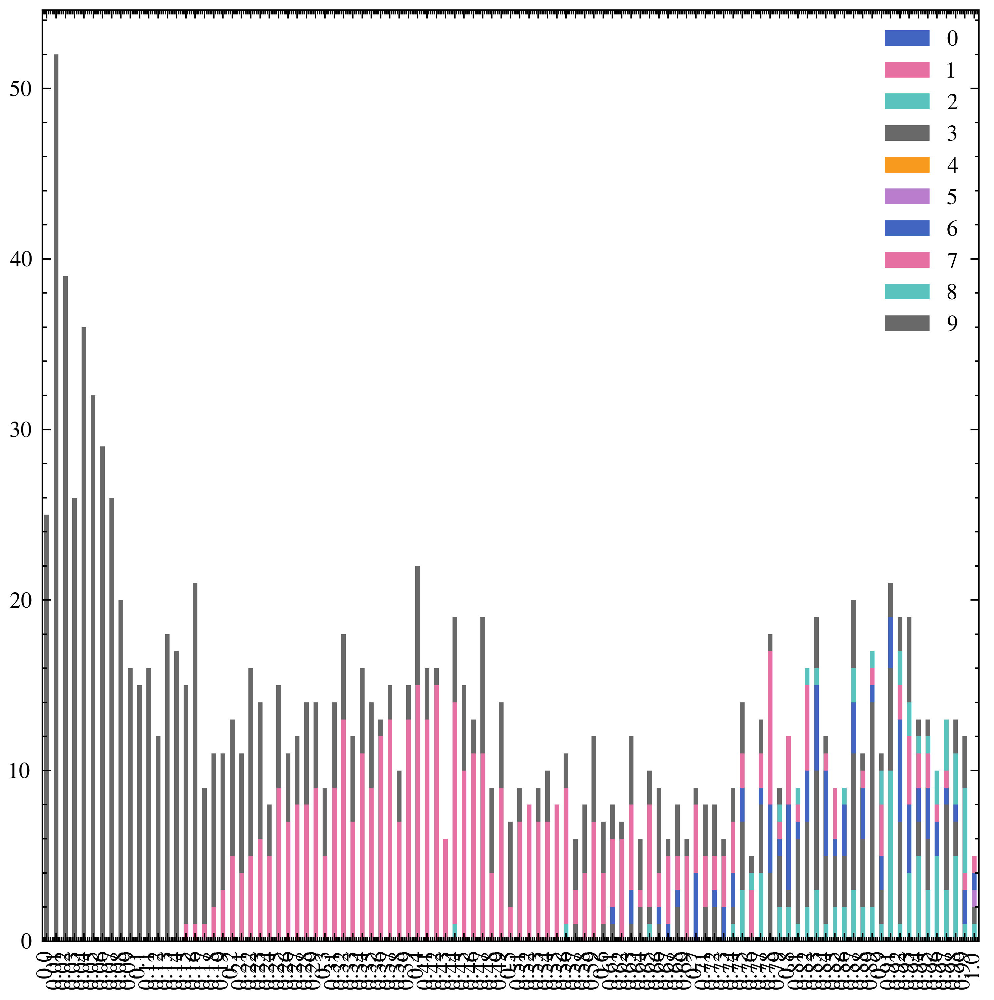

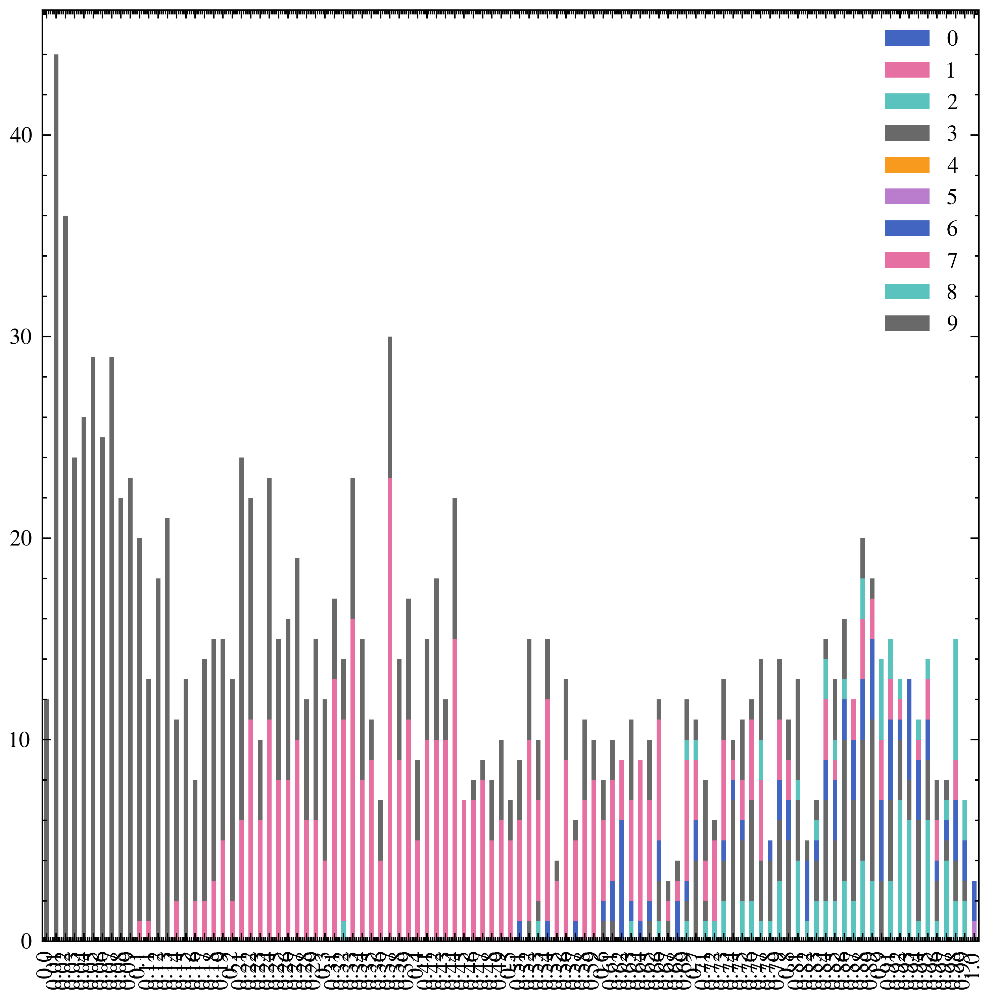

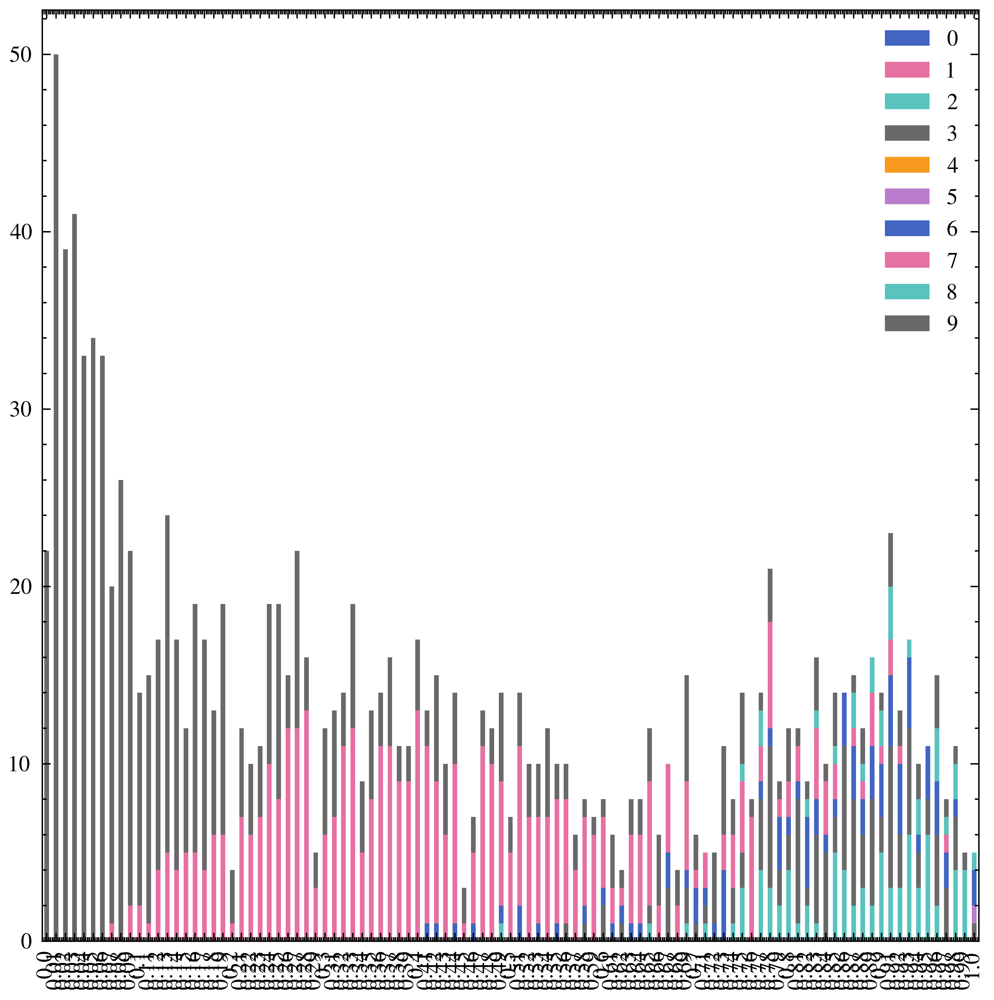

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas
plt.style.use(['science','ieee','retro'])
for epoch in range(20):
    fig=plt.figure()
    ax=fig.add_subplot(111)

    df_epoch = res_df_ict[res_df_ict["epoch"]==epoch]
    res_temp = {x:{j:0 for j in range(10)} for x in df_epoch["g"].unique()}
    for g_target in res_temp.keys():
        for i in range(10):
            res_temp[g_target][i]=((df_epoch["label"]==i)&(df_epoch["g"]==g_target)).sum()
    # df_temp.index = res_df_fedavg["g"].unique()
    res_temp_df = pandas.DataFrame(res_temp)
    res_temp_df = res_temp_df.T.sort_index(ascending=True)
    res_temp_df.plot(kind="bar",stacked=True,figsize=(6,6),ax=ax)
    # ax.set_xlim(0,1)
    # ax.set_ylim(0,600)
    # plt.xlim((0,1))
    # plt.legend(loc="upper left",ncol= 10)
    plt.show()


In [130]:
res_ensemble_per_class = {x:{y:0 for y in range(10)} for x in range(20)}

for e,v in res_ensemble_per_class.items():
    for c in v.keys():
        v[c] = round(res_df_ensemble[(res_df_ensemble["label"]==c)&(res_df_ensemble["epoch"]==e)]["g"].sum(),2)

res_ensemble_per_class_df = pandas.DataFrame(res_ensemble_per_class)

In [131]:
res_global_per_class = {x:{y:0 for y in range(10)} for x in range(20)}

for e,v in res_global_per_class.items():
    for c in v.keys():
        v[c] = round(res_df_global[(res_df_global["label"]==c)&(res_df_global["epoch"]==e)]["g"].sum(),2)

res_global_per_class_df = pandas.DataFrame(res_global_per_class)

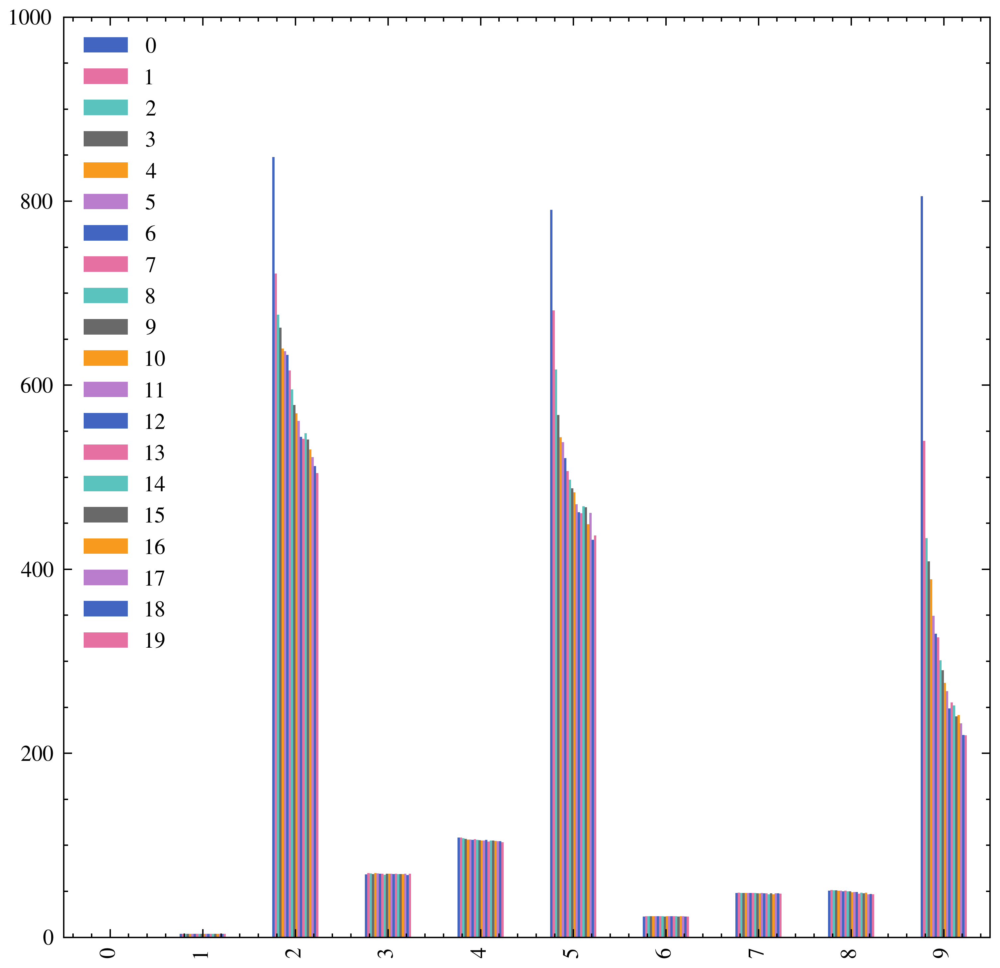

In [139]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas
plt.style.use(['science','ieee','retro'])
# for epoch in range(20):


res_fedavg_per_class_df.plot(kind="bar",stacked=False,figsize=(6,6))
plt.ylim((0, 1000))
# plt.legend(loc="upper left",ncol= 10)
plt.show()

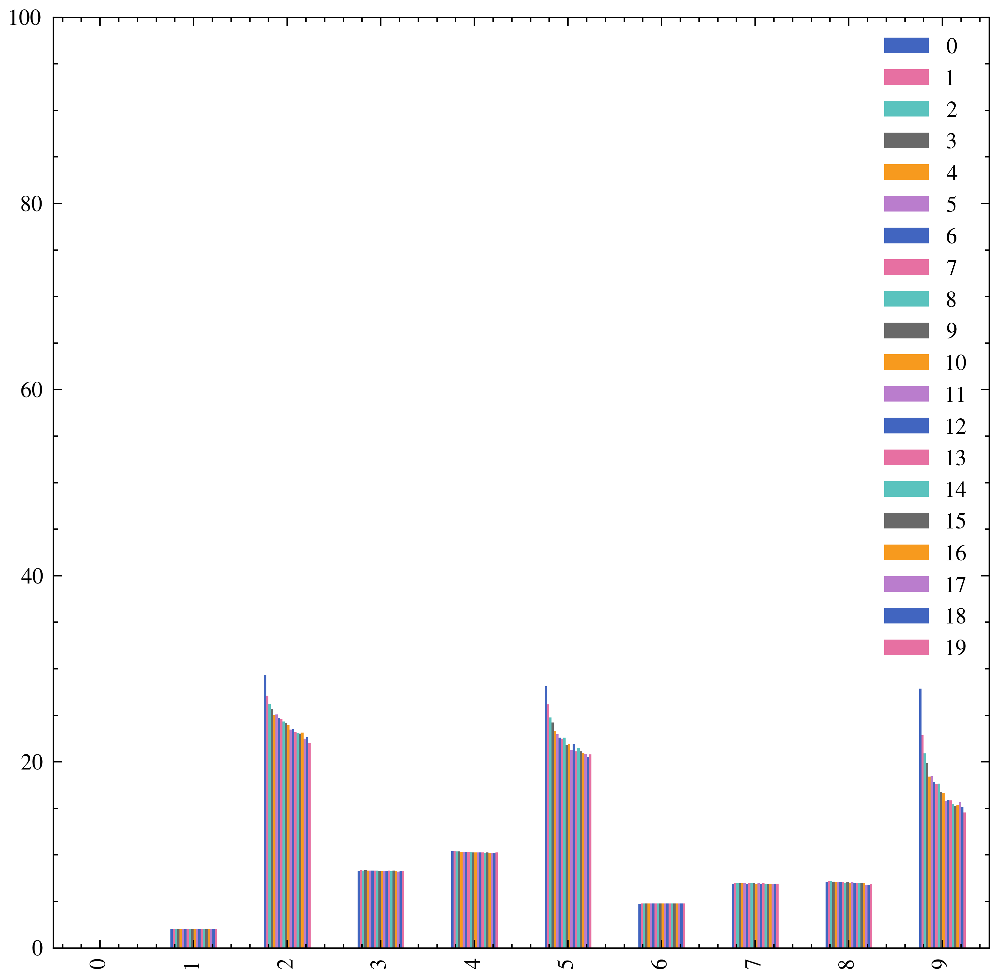

In [143]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas
plt.style.use(['science','ieee','retro'])
# for epoch in range(20):

res_global_per_class_df_log = res_global_per_class_df.apply(np.sqrt)
res_global_per_class_df_log.plot(kind="bar",stacked=False,figsize=(6,6))
plt.ylim((0, 100))
# plt.legend(loc="upper left",ncol= 10)
plt.show()

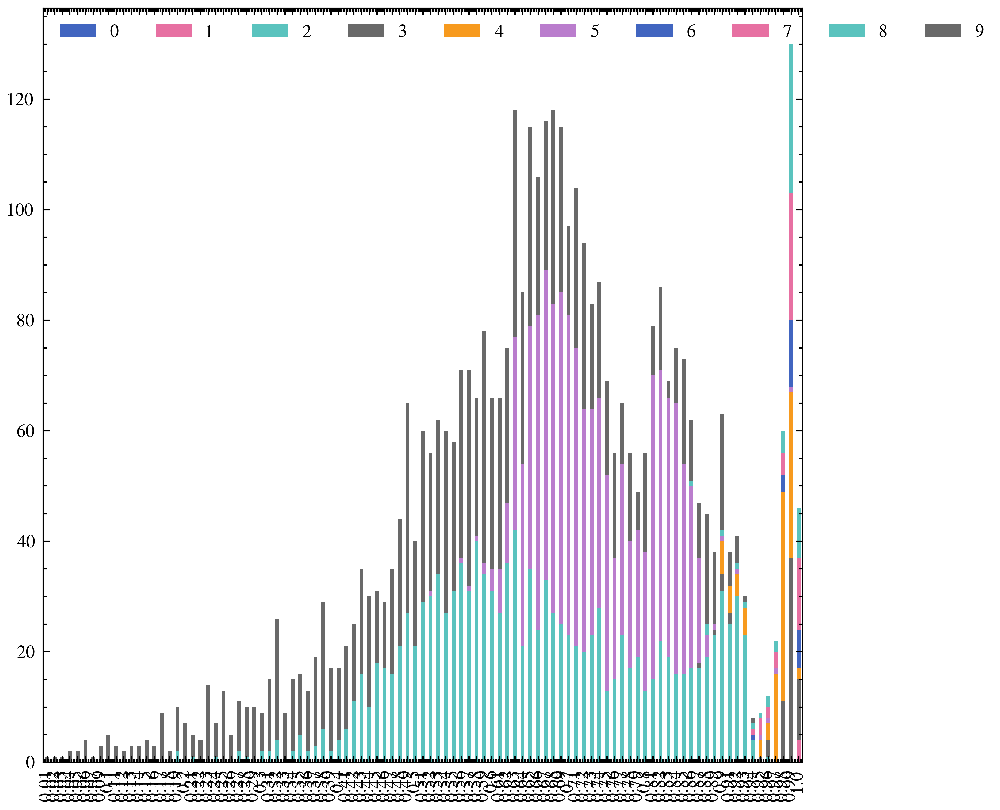

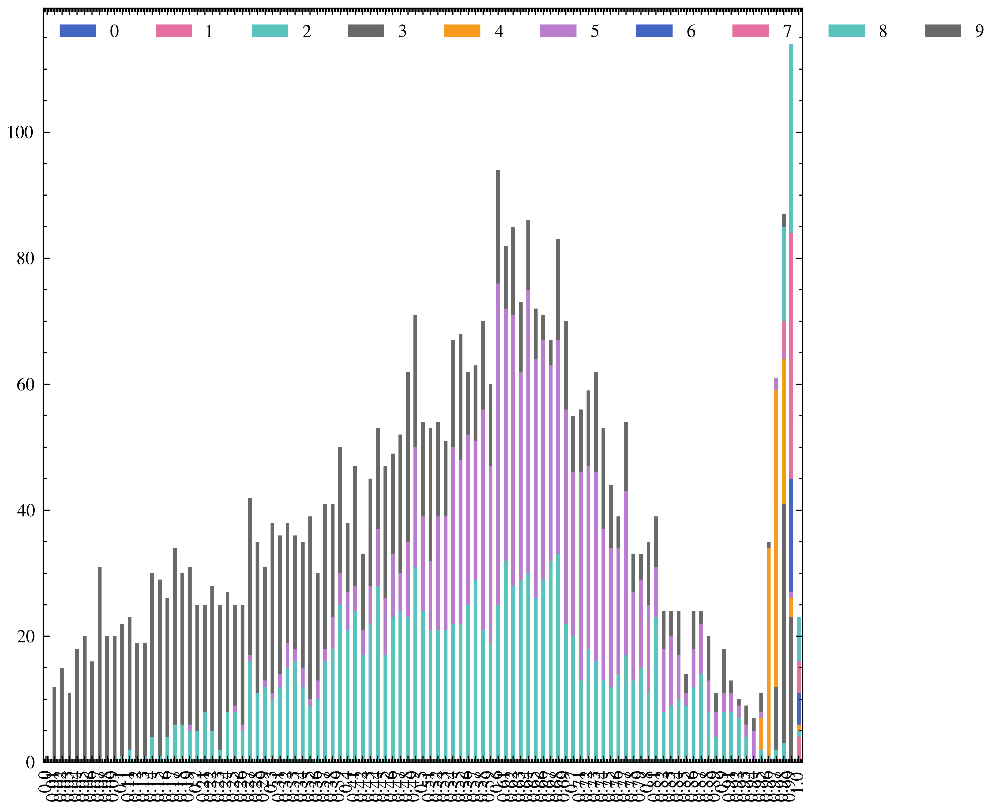

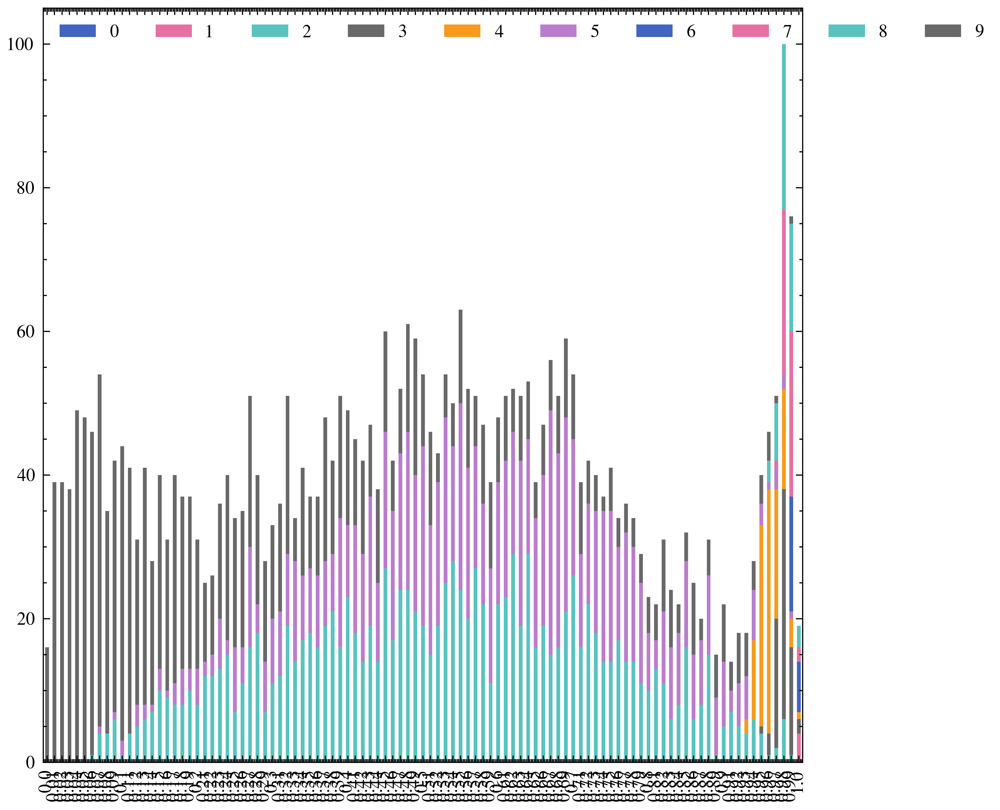

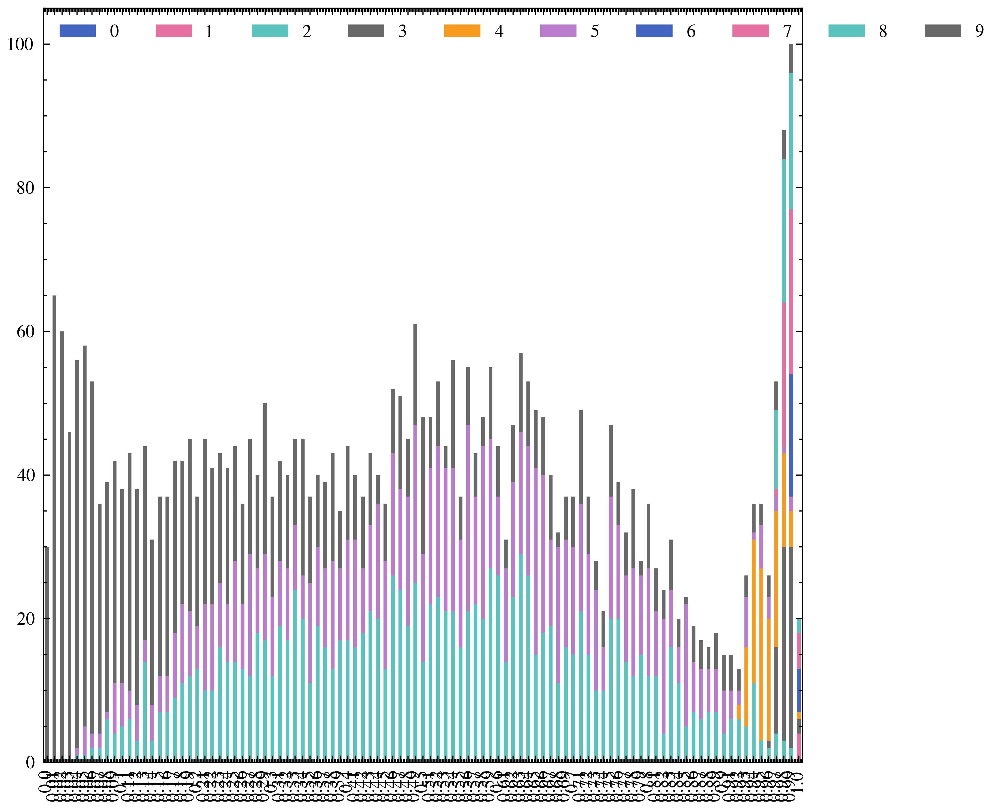

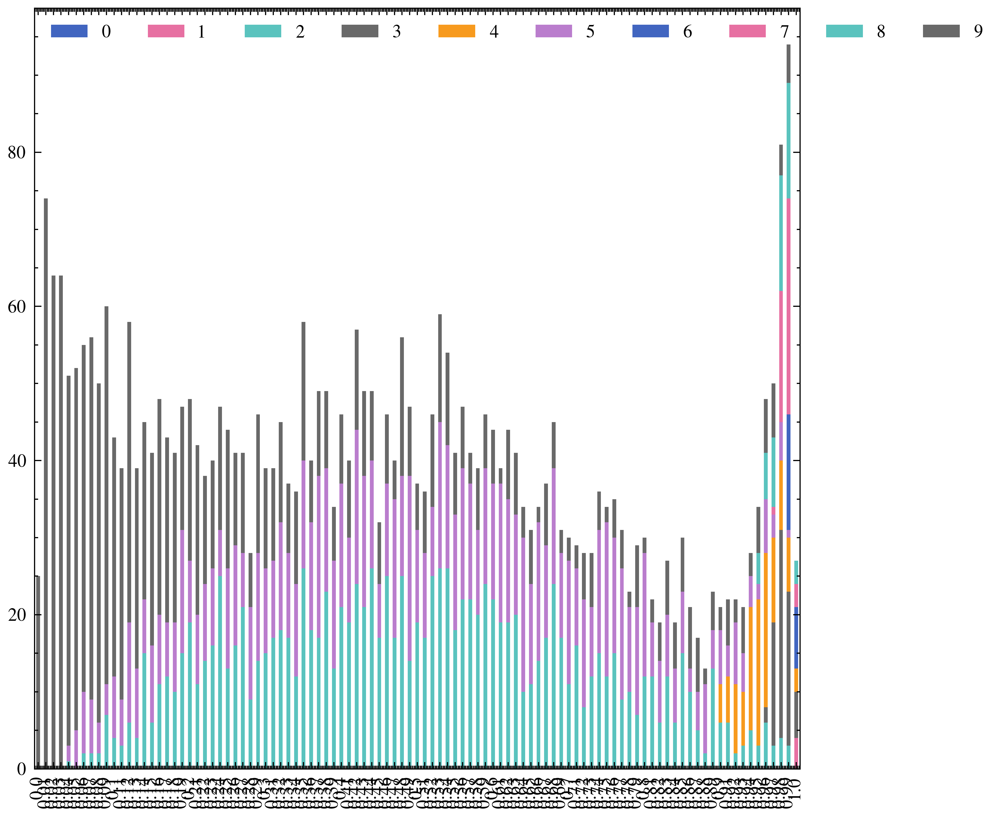

...

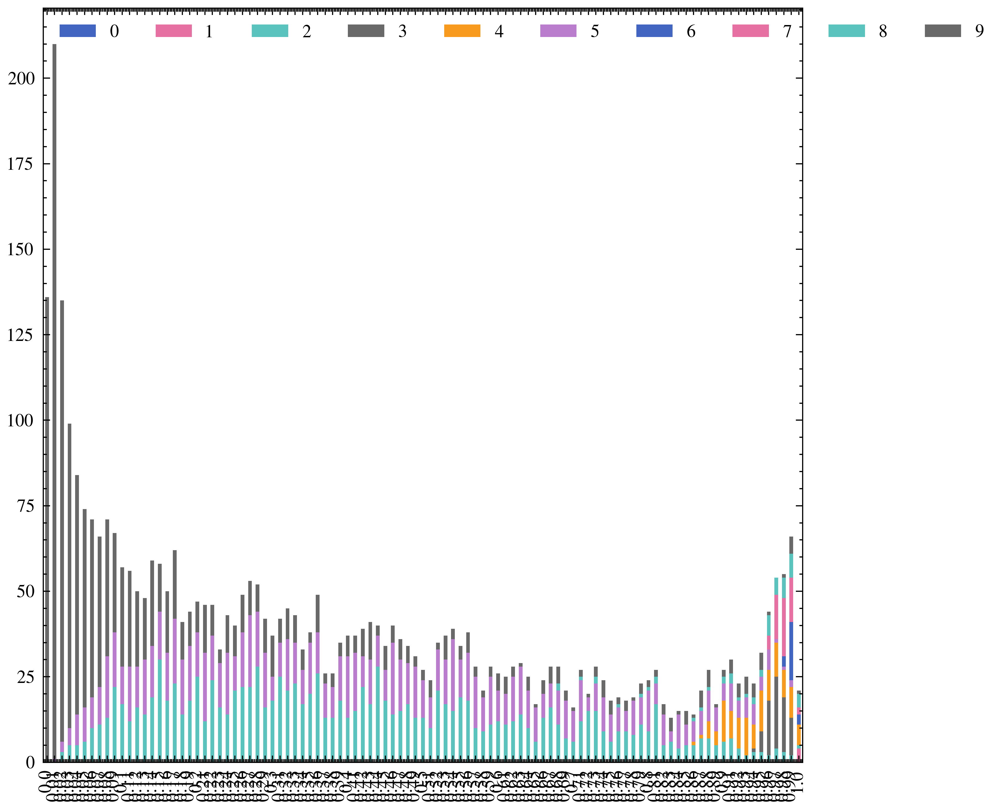

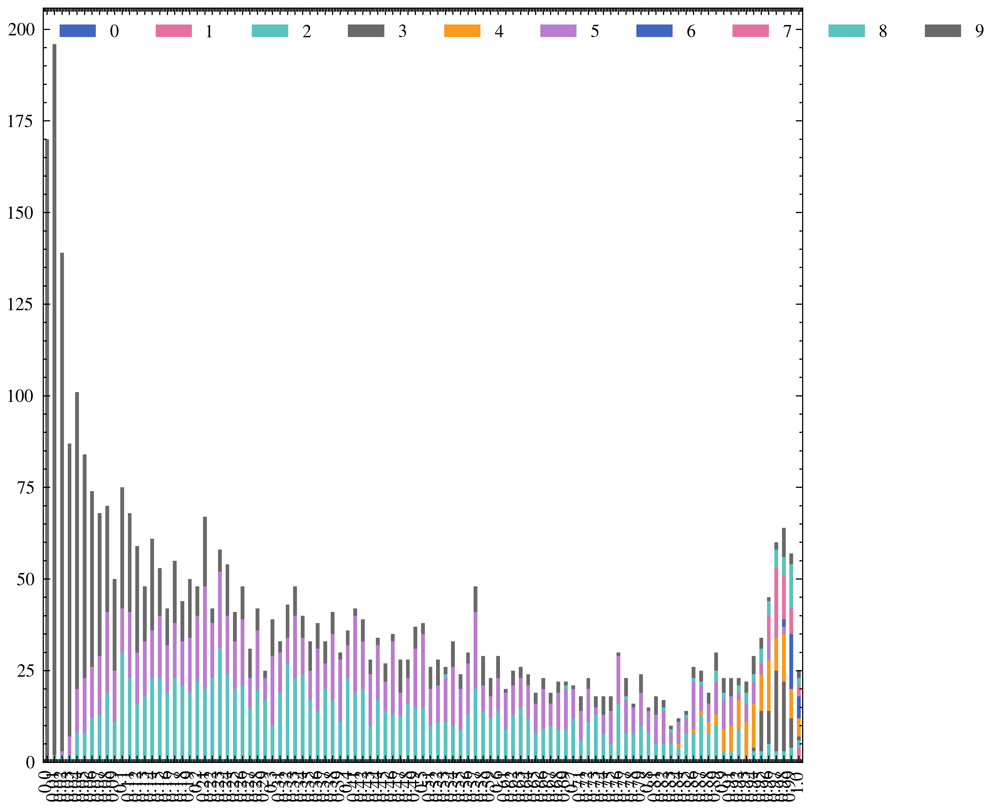

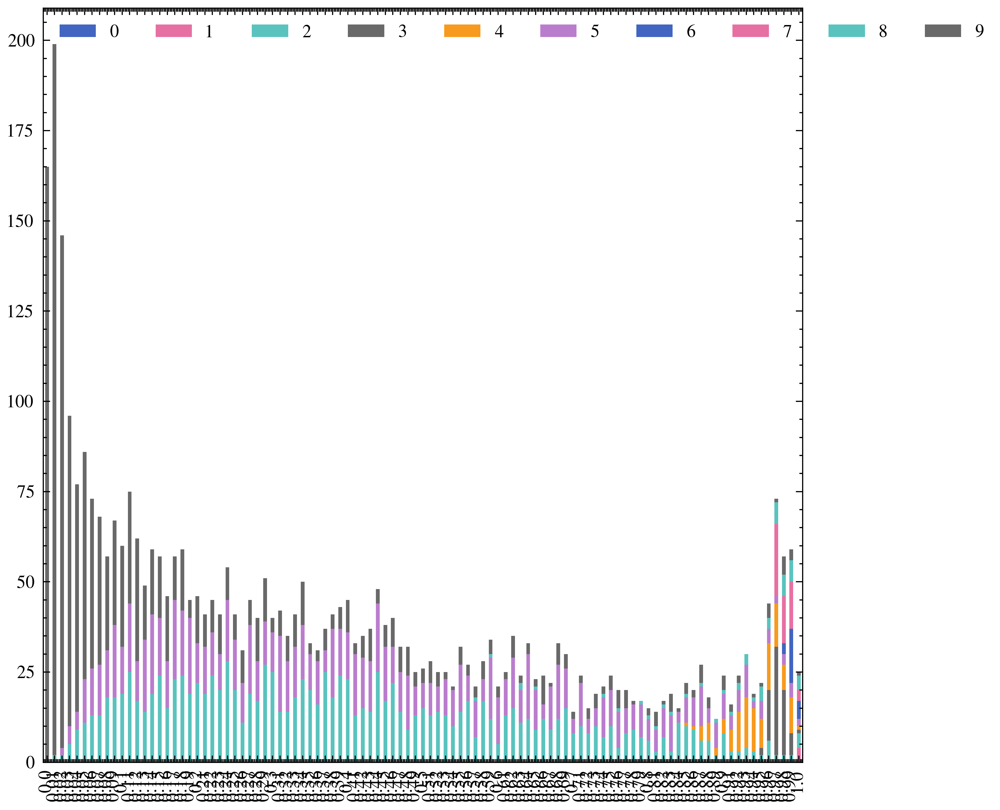

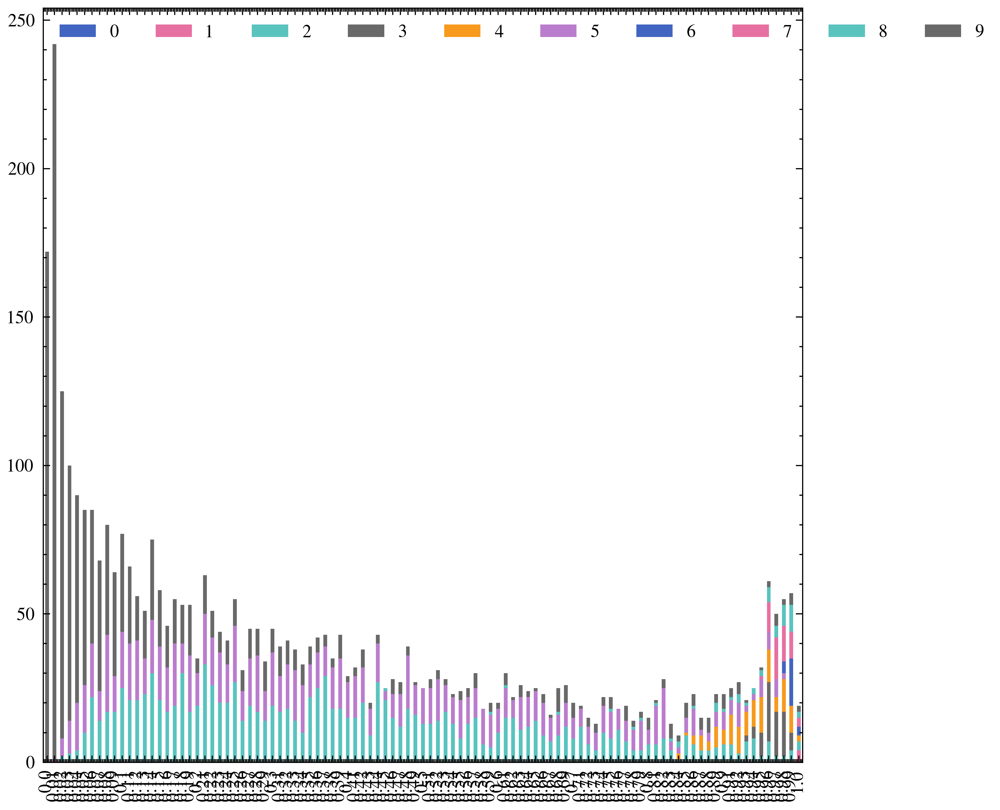

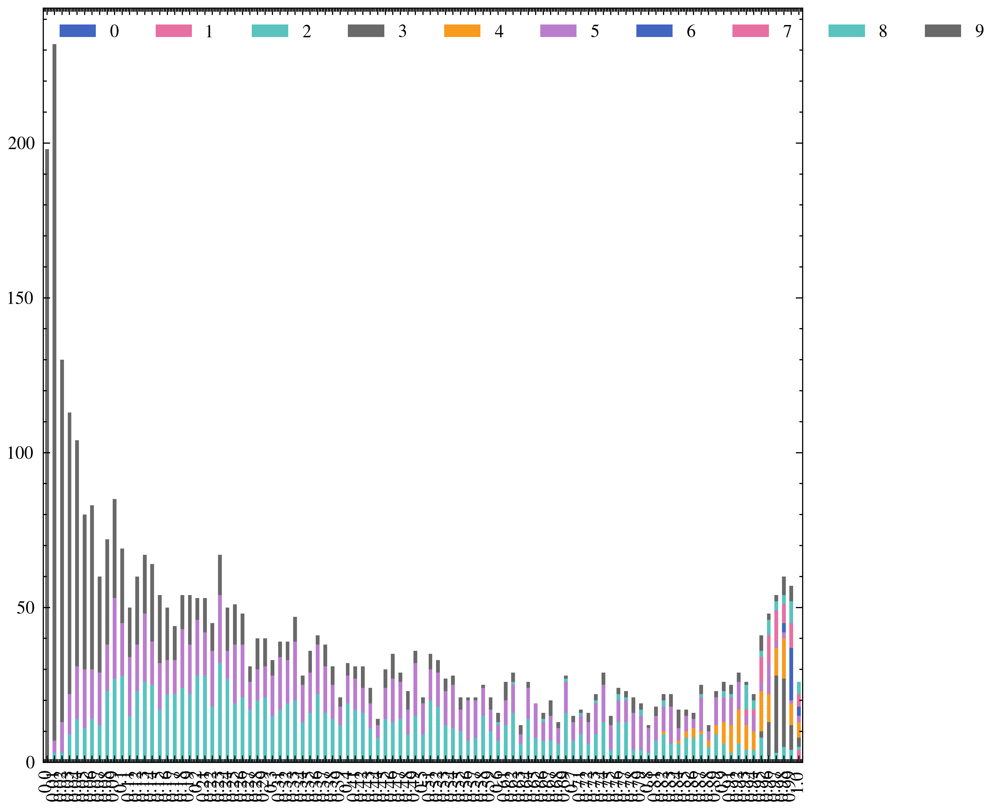

In [77]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas
plt.style.use(['science','ieee','retro'])
for epoch in range(20):
    df_epoch = res_df_fedavg[res_df_fedavg["epoch"]==epoch]
    res_temp = {x:{j:0 for j in range(10)} for x in df_epoch["g"].unique()}
    for g_target in res_temp.keys():
        for i in range(10):
            res_temp[g_target][i]=((df_epoch["label"]==i)&(df_epoch["g"]==g_target)).sum()
    # df_temp.index = res_df_fedavg["g"].unique()
    res_temp_df = pandas.DataFrame(res_temp)
    res_temp_df = res_temp_df.T.sort_index(ascending=True)
    res_temp_df.plot(kind="bar",stacked=True,figsize=(6,6))
    plt.legend(loc="upper left",ncol= 10)
    plt.show()


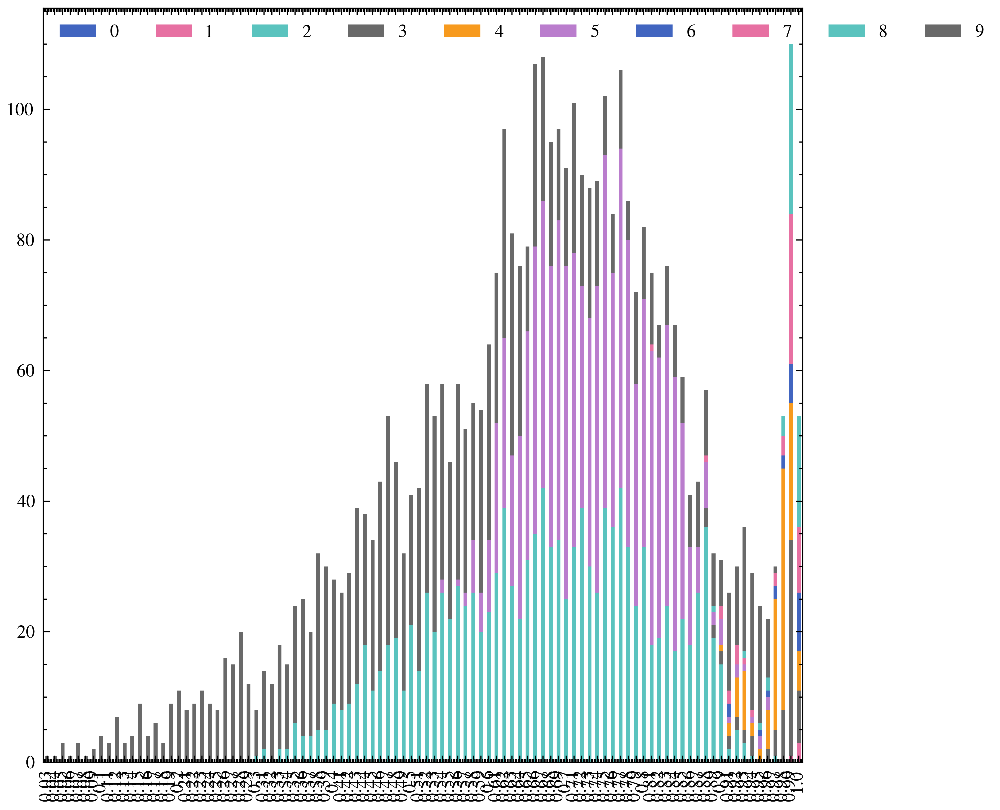

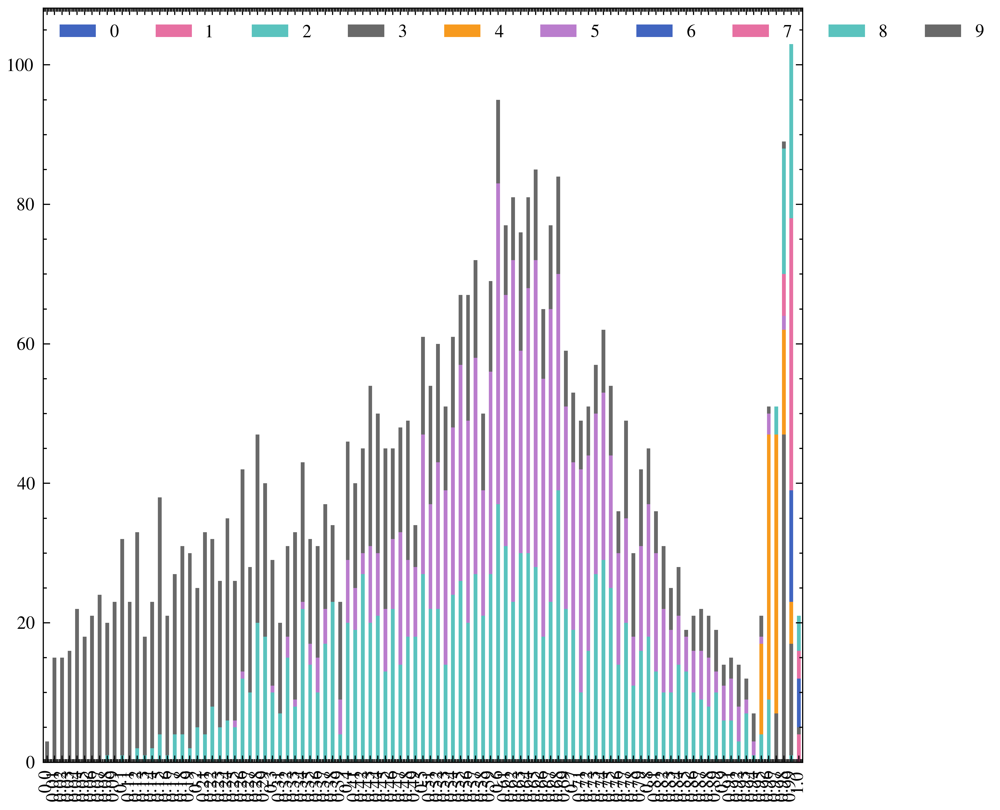

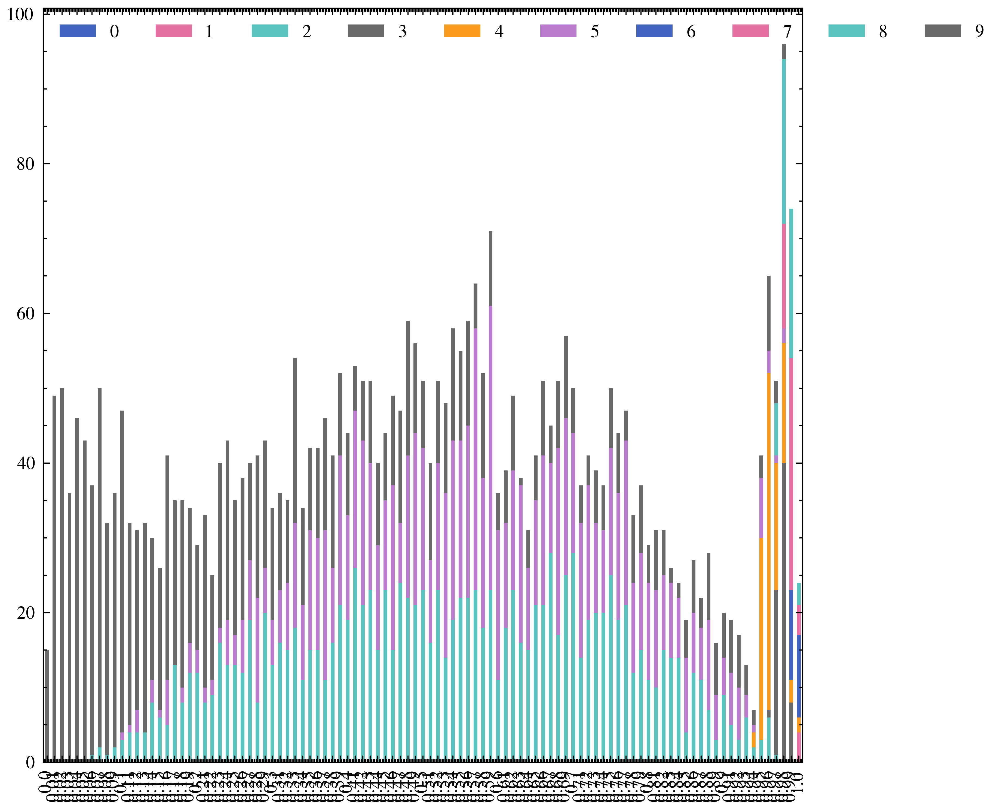

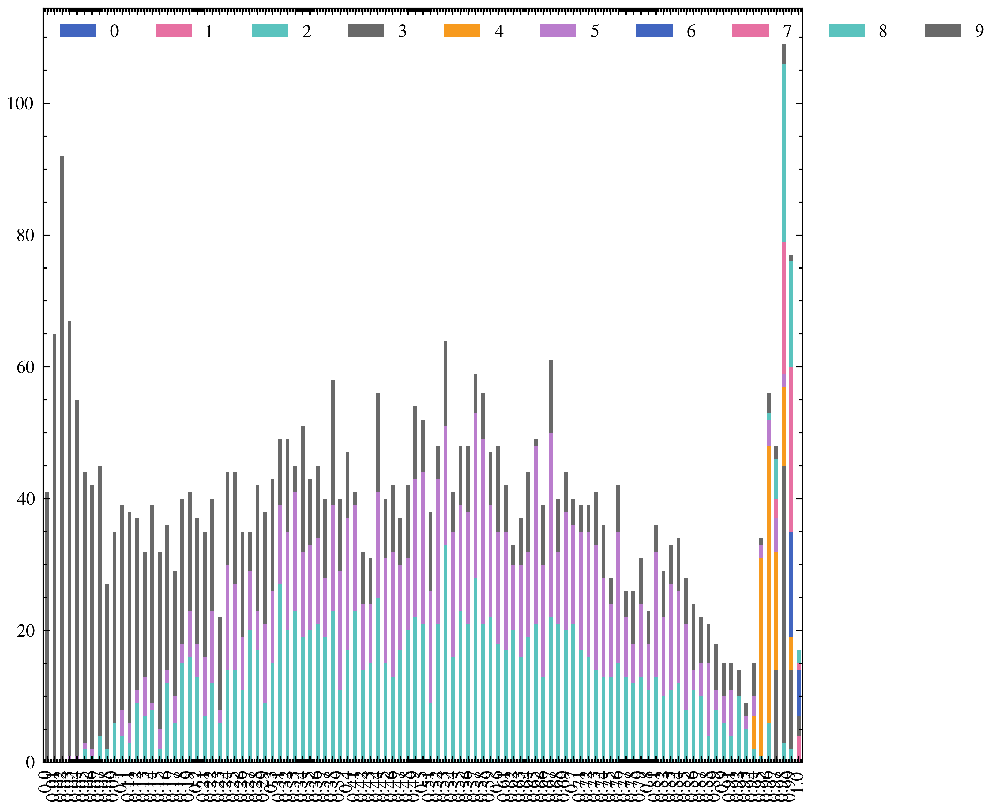

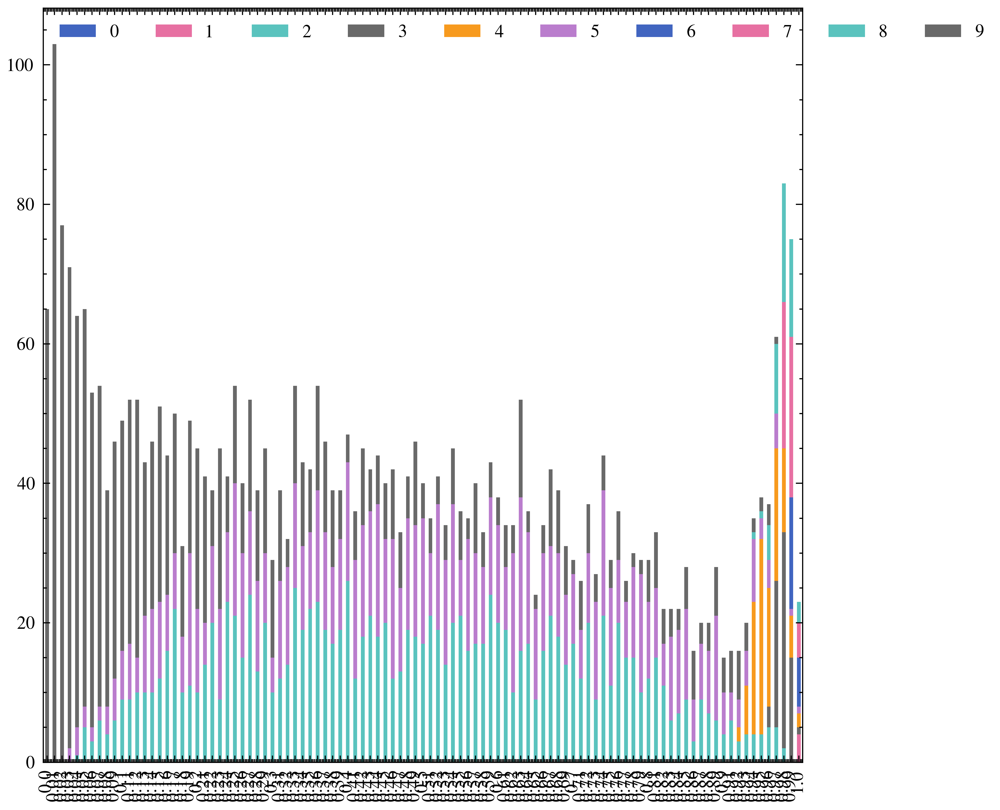

...

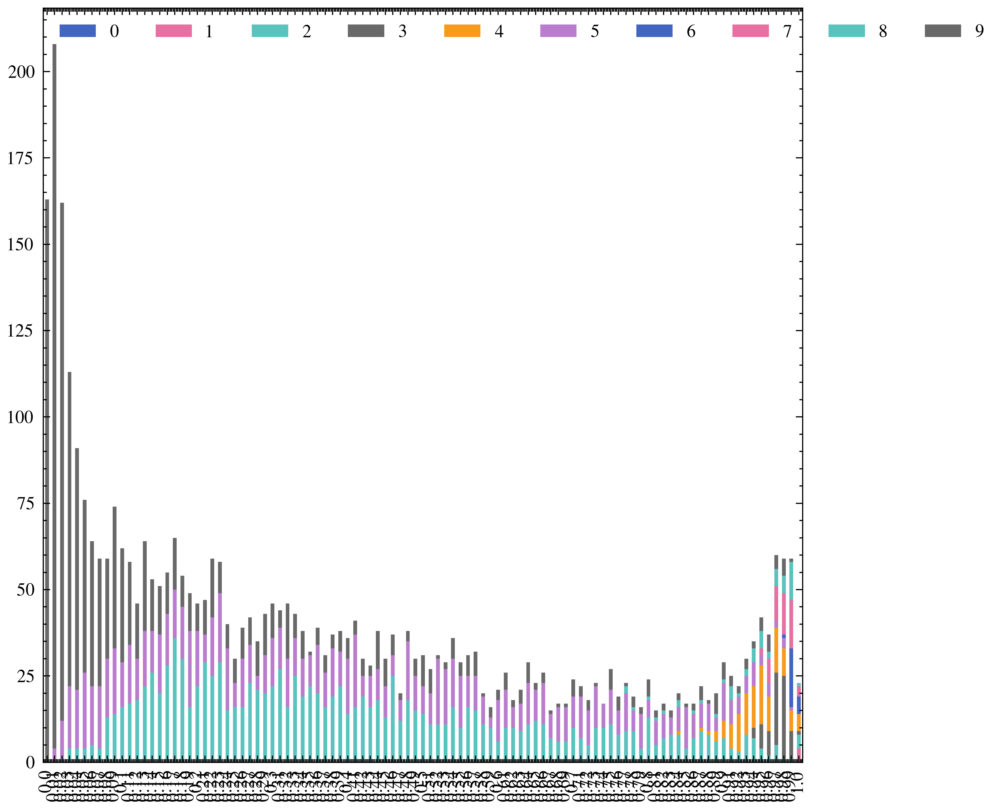

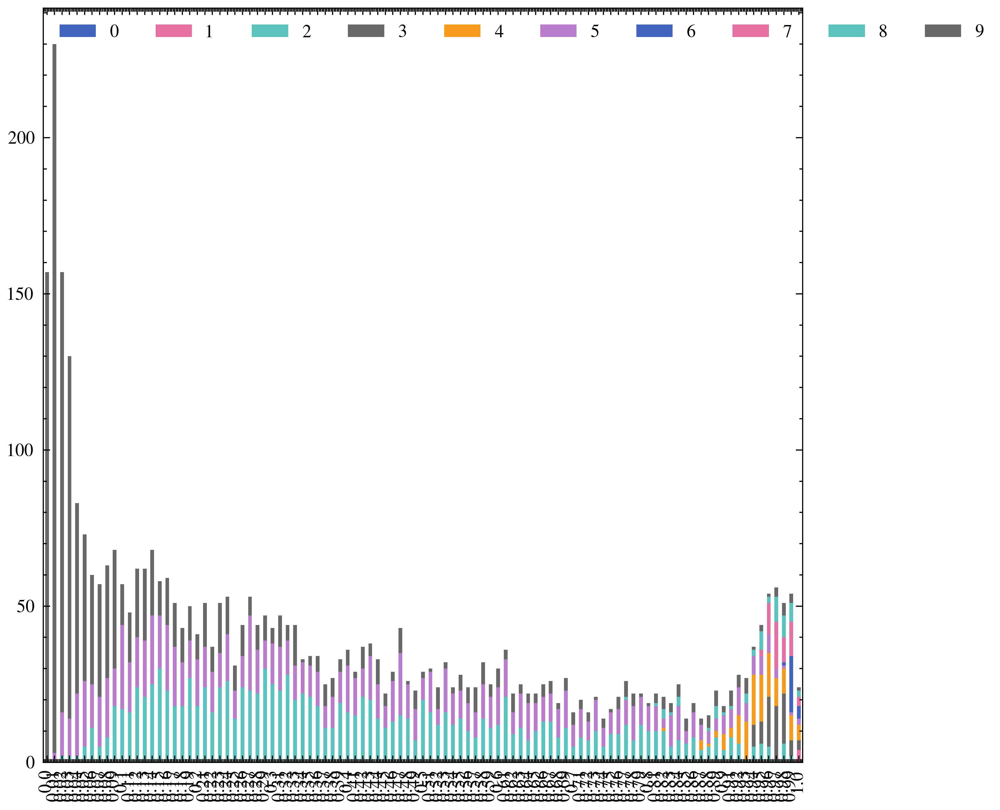

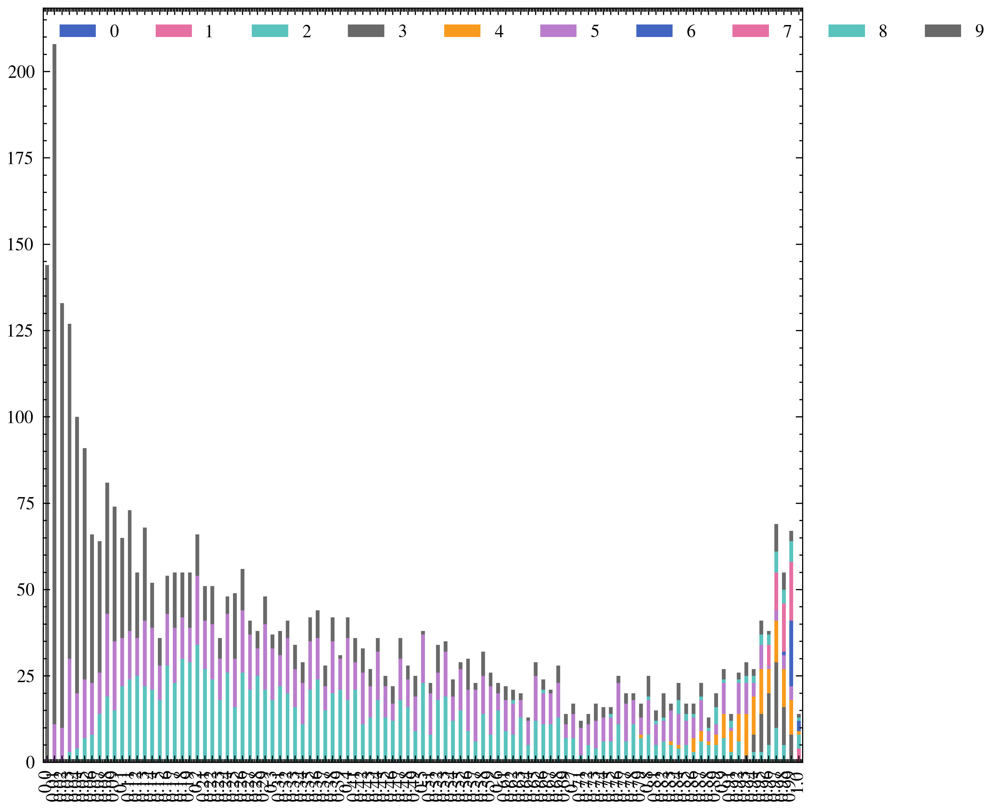

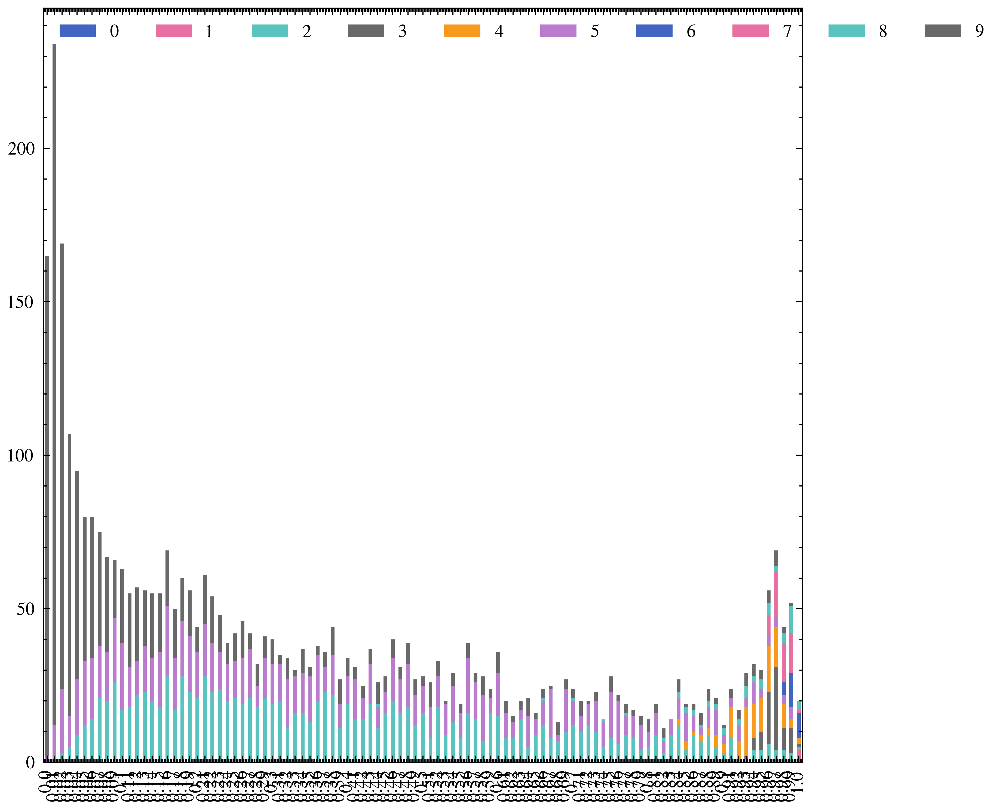

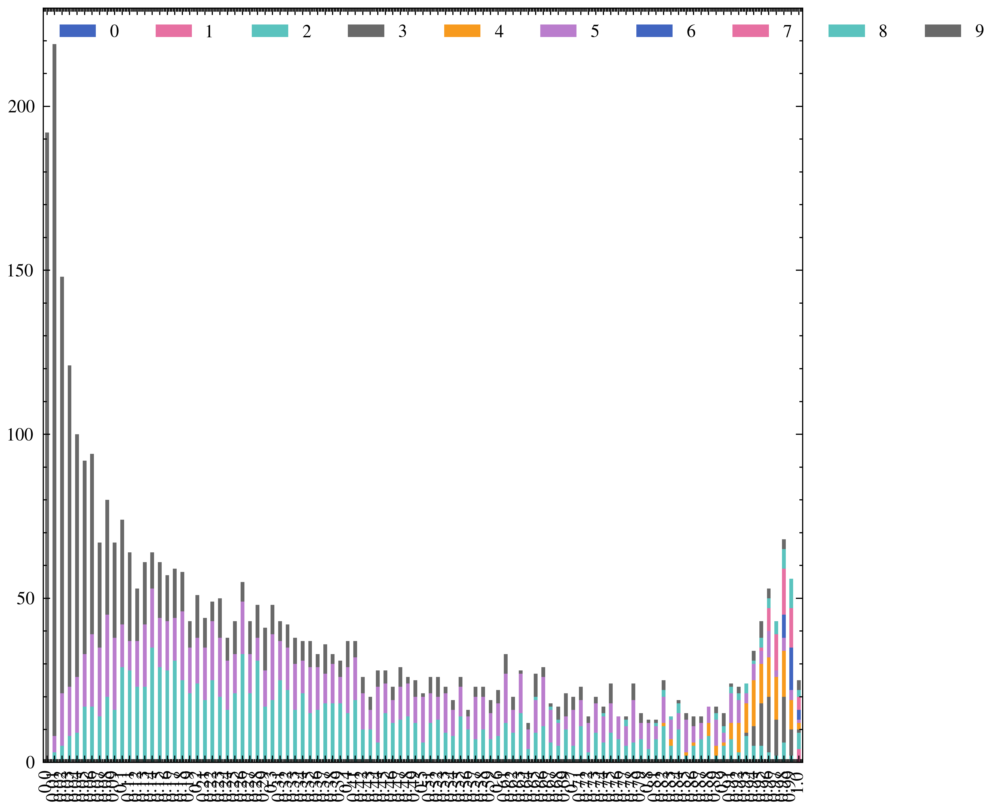

In [126]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas
plt.style.use(['science','ieee','retro'])
for epoch in range(20):
    df_epoch = res_df_ensemble[res_df_ensemble["epoch"]==epoch]
    res_temp = {x:{j:0 for j in range(10)} for x in df_epoch["g"].unique()}
    for g_target in res_temp.keys():
        for i in range(10):
            res_temp[g_target][i]=((df_epoch["label"]==i)&(df_epoch["g"]==g_target)).sum()
    # df_temp.index = res_df_fedavg["g"].unique()
    res_temp_df = pandas.DataFrame(res_temp)
    res_temp_df = res_temp_df.T.sort_index(ascending=True)
    res_temp_df.plot(kind="bar",stacked=True,figsize=(6,6))
    plt.legend(loc="upper left",ncol= 10)
    plt.show()


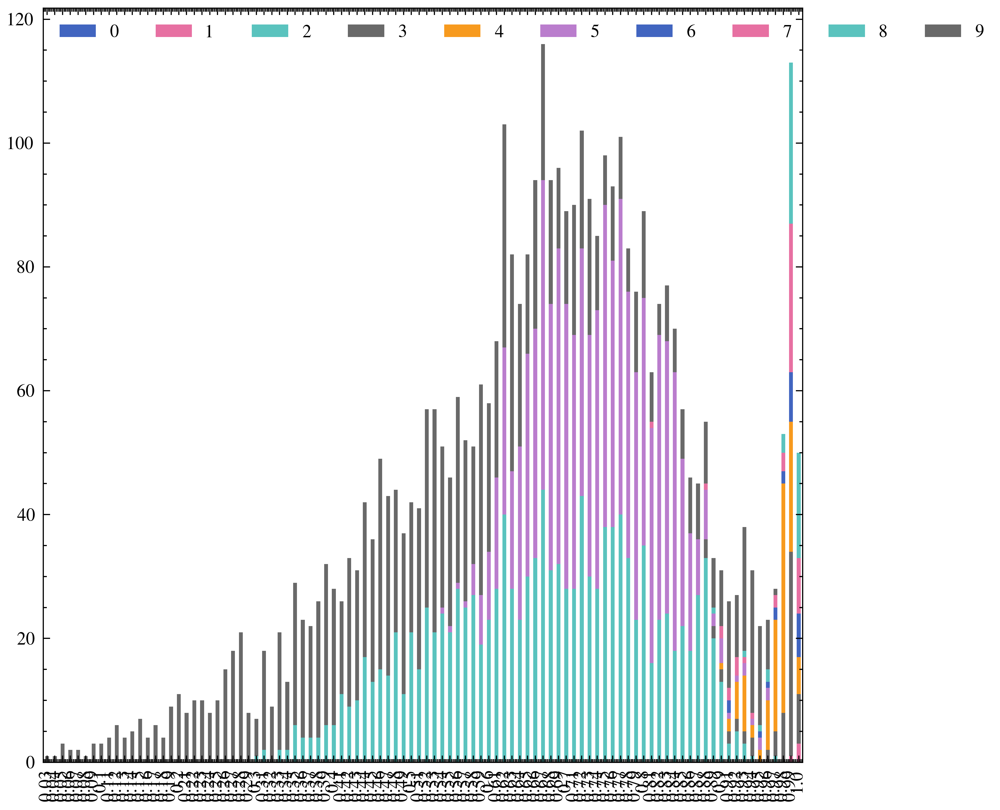

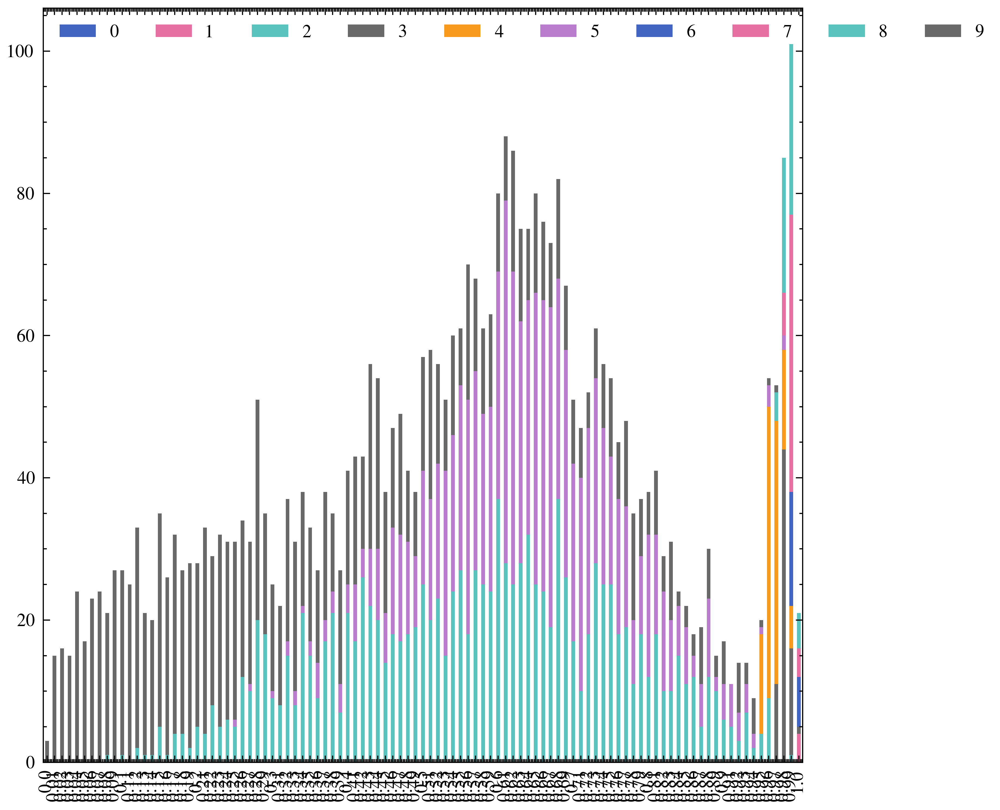

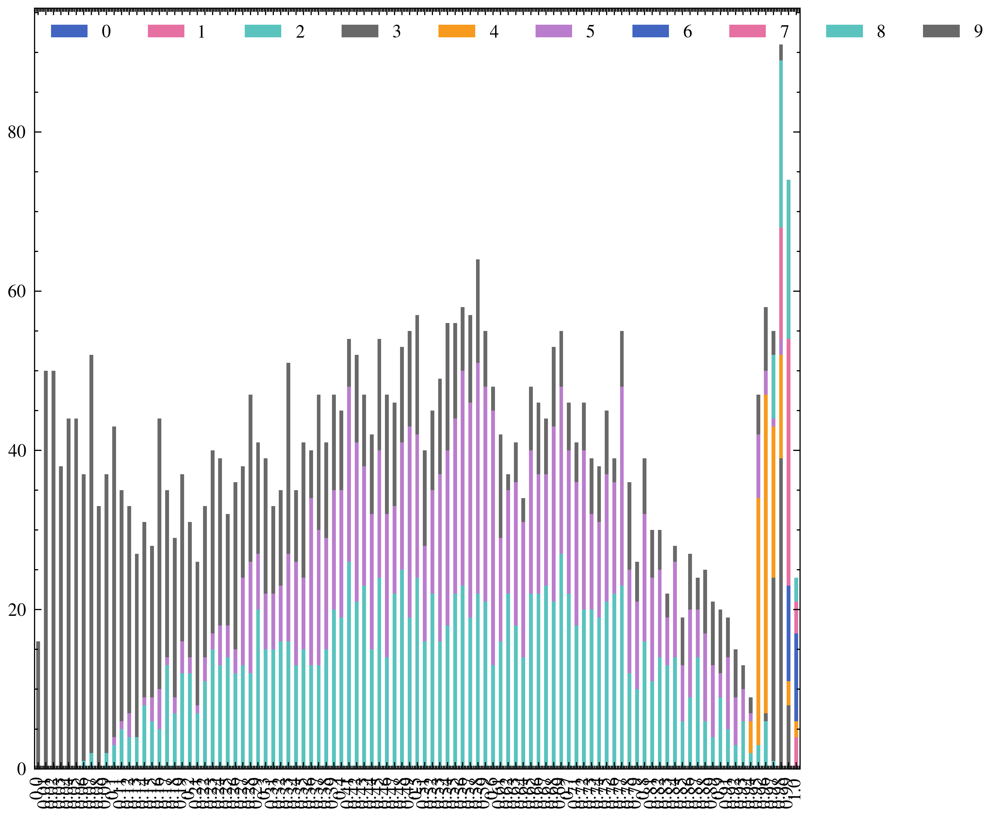

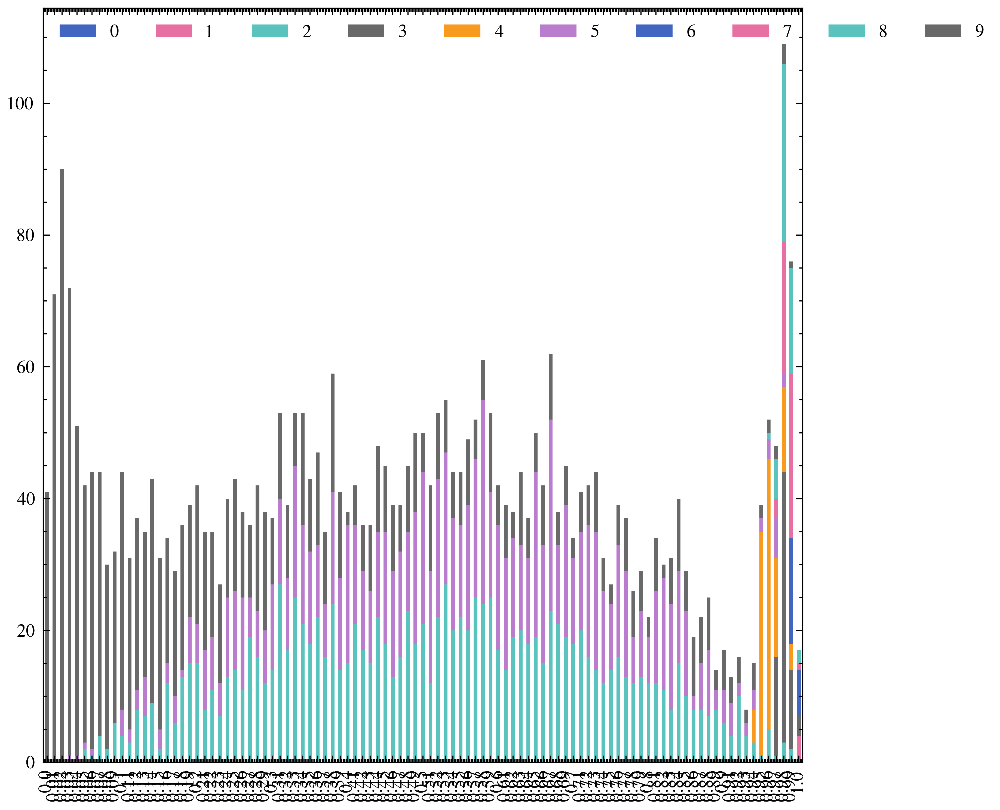

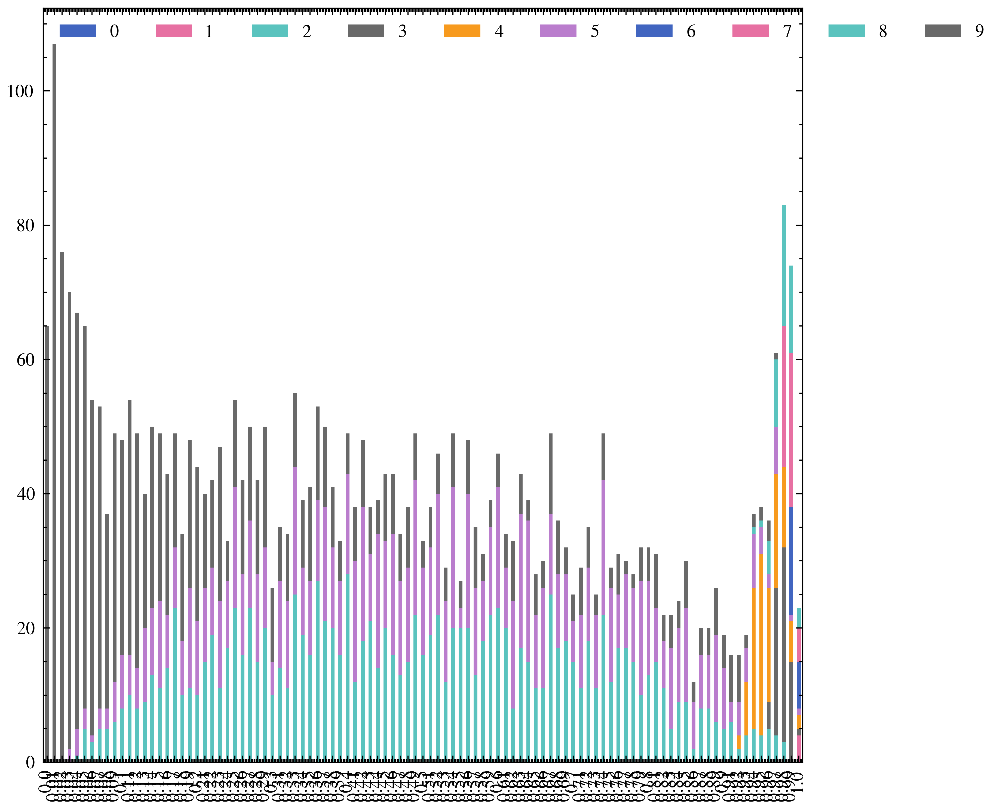

...

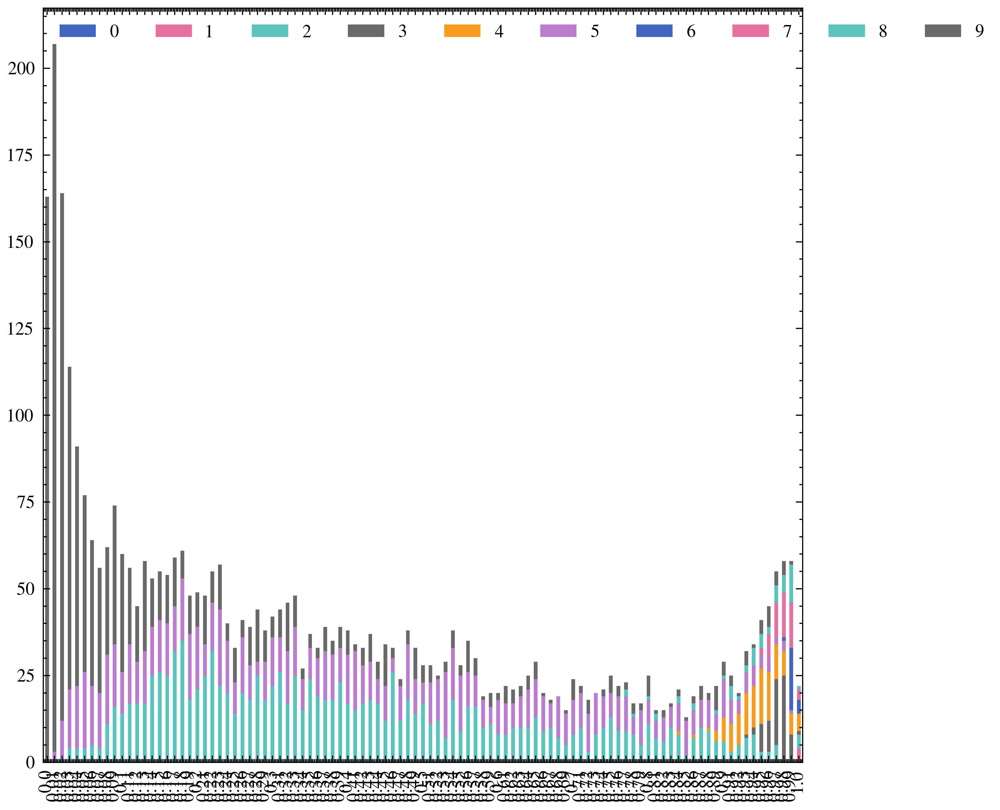

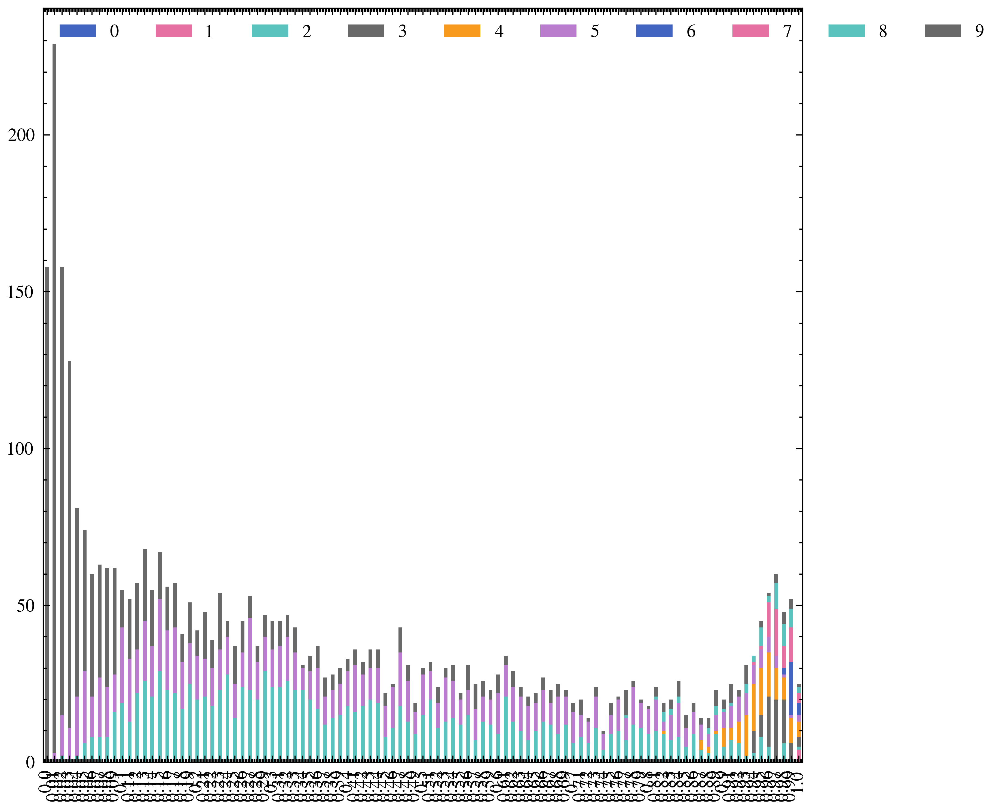

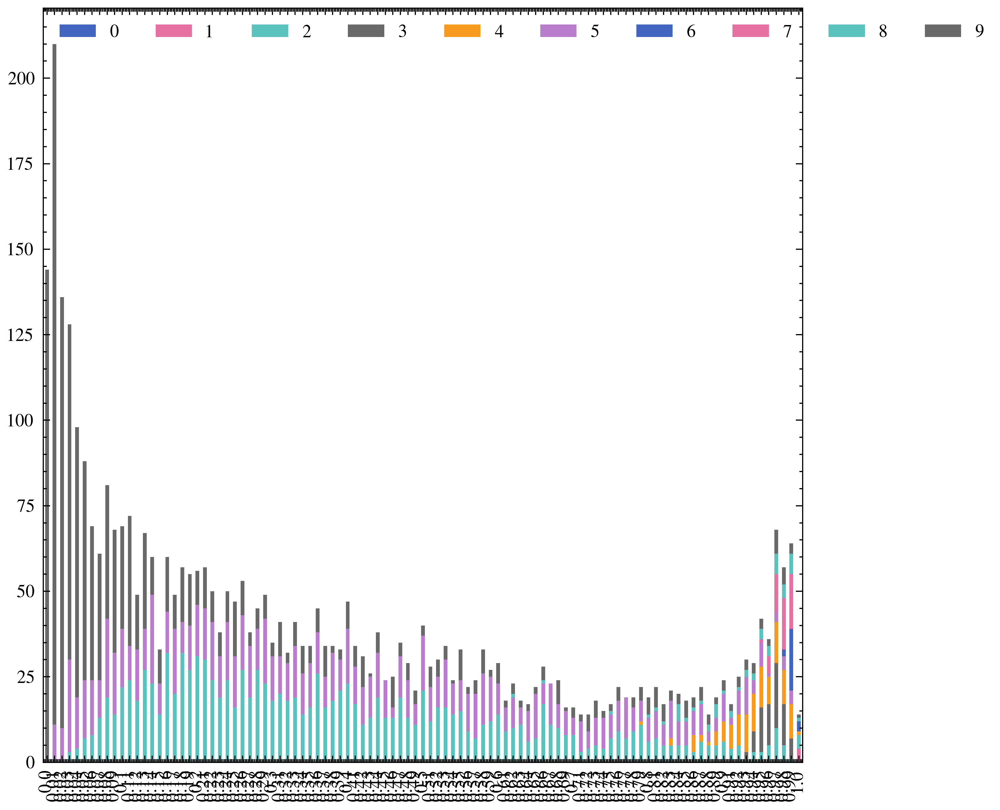

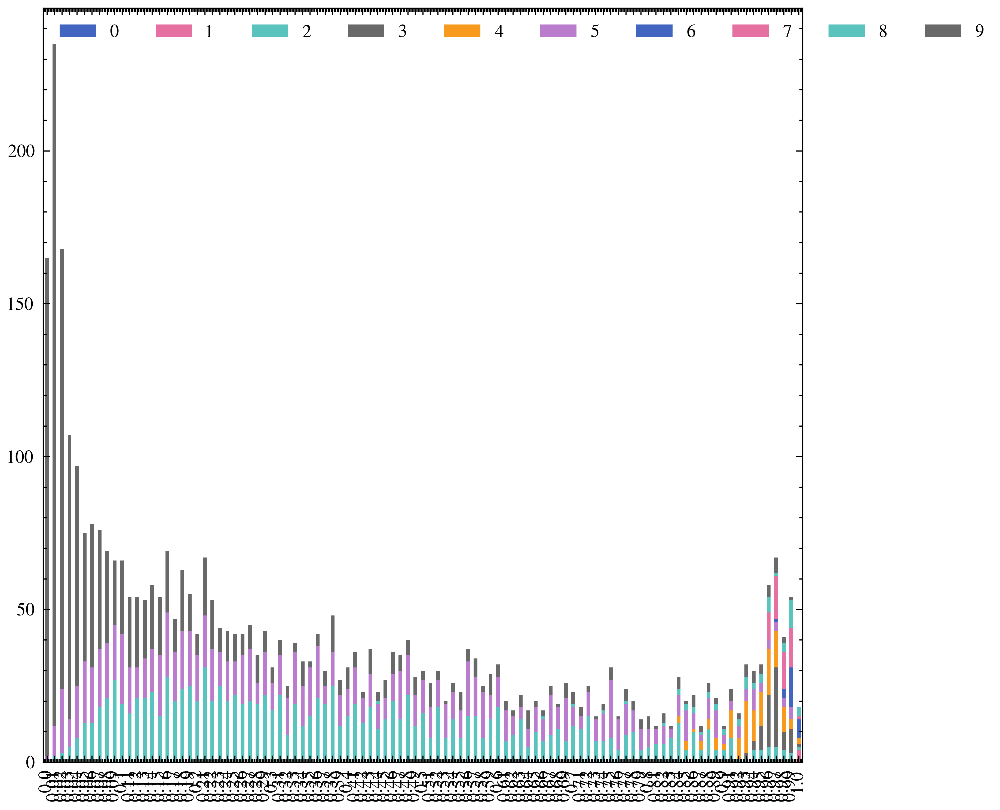

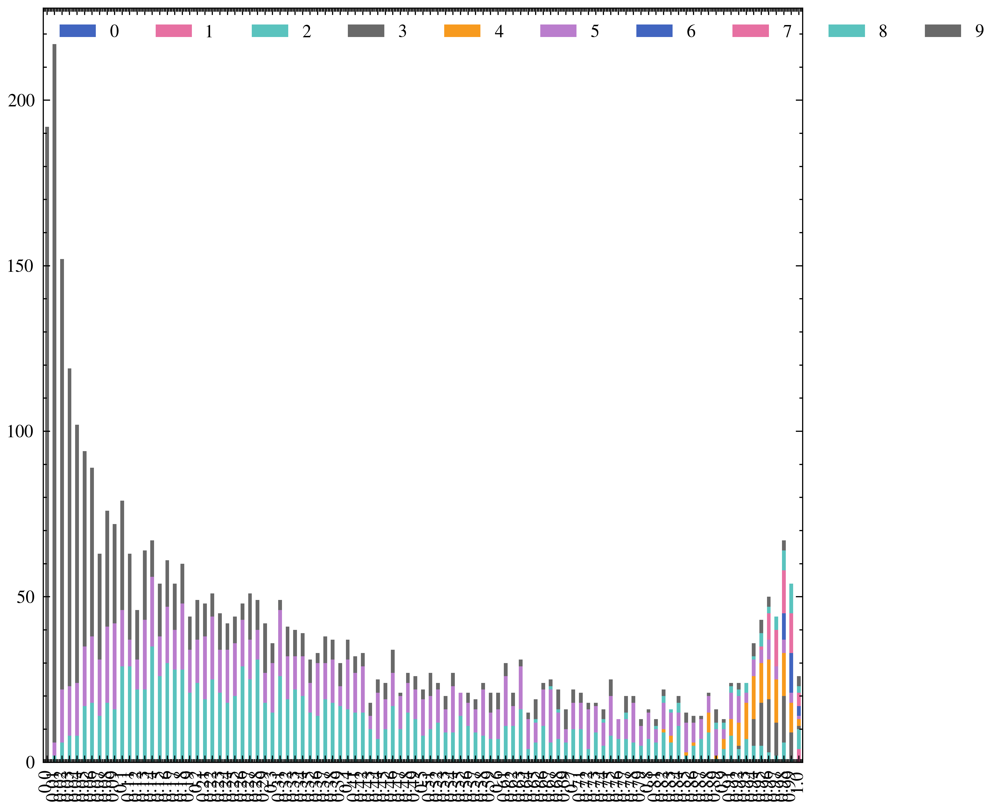

In [127]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas
plt.style.use(['science','ieee','retro'])
for epoch in range(20):
    df_epoch = res_df_global[res_df_global["epoch"]==epoch]
    res_temp = {x:{j:0 for j in range(10)} for x in df_epoch["g"].unique()}
    for g_target in res_temp.keys():
        for i in range(10):
            res_temp[g_target][i]=((df_epoch["label"]==i)&(df_epoch["g"]==g_target)).sum()
    # df_temp.index = res_df_fedavg["g"].unique()
    res_temp_df = pandas.DataFrame(res_temp)
    res_temp_df = res_temp_df.T.sort_index(ascending=True)
    res_temp_df.plot(kind="bar",stacked=True,figsize=(6,6))
    plt.legend(loc="upper left",ncol= 10)
    plt.show()
